# Projet - préambule

Ce projet est réalisée par Zineb Bermaki pour mettre en oeuvre les compétences aquises lors du cours de système de recommandation du Master Executive IA et Sciences des données (2023-2024).

Il s'agit de construire toute la pipeline d'un système de recommandation : chargement et analyse des données, échantillonage, définition et entrainement d'un modèle basé sur le collaborative filtering, évaluation et tuning des hyper paramètres et hybridation avec l'ajout des items features. Le tout est basé sur un dataset H&M disponible sur Kaggle avec l'utilisation de la librairie LightFM.


# Analyse des données



In [1]:
!pip install ydata_profiling
!pip install lightfm

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 356.2/356.2 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 28.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 85.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=4aba548f5d0a7eb2e73335bd04bec4e791ce8b6ad40a3db79ef4b6bb4786bb07
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.4/316.4 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lightfm: filename=lightfm-1.17-cp310-cp310-linux_x86_64.whl size=804888 sha256=2c6c00a754b25eeac04cd5d2023e20e7654b744aaf033f82d49

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import ydata_profiling
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

from google.colab import drive

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder

from transformers import BertTokenizer, BertModel

from lightfm.data import Dataset
from lightfm import LightFM
from lightfm.evaluation import precision_at_k
from lightfm.evaluation import auc_score
from lightfm.cross_validation import random_train_test_split


In [8]:
drive.mount('/content/drive')

Mounted at /content/drive


## Clients

Dans des systèmes de recommendation basés sur du filtering collaboratif - utilisateur ou hybride, l'idée sous jacente est l'utilisation des données permettant d'identifier un pattern/une structure qui dessine les contours d'un utilisateur type (sur base de ses interactions) pour le rapprocher des autres utilisateurs ayant le même pattern et ainsi recommender les items majoritairement consommés par le pattern d'après les données historiques disponibles.

Cette technique nécessite d'avoir assez de données sur les utilisateurs pour en déduire un pattern significatif:
- données descriptives de l'utilisateur comme son âge, ses revenus, son sexe, sa taille...
- données comportementales de l'utilisateur comme ses achats, sa navigation, ses avis...
- données contextuelles de l'utilisateur comme sa position géographique, la météo locale, son appareil...

La première étape de notre analyse des données portera donc sur l'identification des données exploitables disponibles pour les clients.

In [5]:
# Chargement des données
dfclient = pd.read_csv('/content/drive/MyDrive/0-ME-IASD/Recommendation/Lab/Projet/customers.csv')
dfclient.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1371980 entries, 0 to 1371979
Data columns (total 7 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   customer_id             1371980 non-null  object 
 1   FN                      476930 non-null   float64
 2   Active                  464404 non-null   float64
 3   club_member_status      1365918 non-null  object 
 4   fashion_news_frequency  1355969 non-null  object 
 5   age                     1356119 non-null  float64
 6   postal_code             1371980 non-null  object 
dtypes: float64(3), object(4)
memory usage: 73.3+ MB


### Rapport

In [ ]:
profile = ProfileReport(dfclient, title="Customer Dataset", html={'style': {'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Observations**



*   customer_id : identifiant unique du client (1 371 980 occurences), sera la clé de jointure avec les interactions.

*   postal_code : avec ces 1 371 980 valorisations, c'est un champ exploitable pour sa complétude. Le code postal indique la zone géographique et cette donnée a une influence sur les habitudes d'achat.

*   age : cette donnée contribue à la définition du type d'acheteur. Absente dans 1.2%.

*   FN/Active : booléen qui semble indiquer si le client est actif ou non. Champs manquants à 65% et 66% du dataset et les champs valorisés le sont toujours à 1. On peut supposer que seulement dans ce cas le client n'as pas demandé à résilier ce compte. Auquel cas il n'est pas nécessaire de calculer les préférences pour 1371980 clients mais seulement pour 464404 clients.
Toutefois, dans les approches basées sur le filtering collaboratif utilisateur, utiliser les patterns de client qui ont résilié leur compte n'est pas à exclure si la réglementation le permets car ça donne plus de cas différents de consommation à rapprocher des clients actifs.
Aucune précision n'est donnée sur Kaggle concernant le contenu de ce champ. Nous ne ferons donc aucun filtrage.

*   club_member_status/fashion_news_frequency :
Ces champs avec une abscence de valorisation  à 0.4% et 1.2% ont une bonne complétude. Il semble y avoir peu d'influence entre ces deux variables et les items achetés.

Pour complément d'informations: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data

## Items

Chargement du catalogue de 105 542 produits.

In [6]:
dfarticles = pd.read_csv('/content/drive/MyDrive/0-ME-IASD/Recommendation/Lab/Projet/articles.csv')
dfarticles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105542 entries, 0 to 105541
Data columns (total 25 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   article_id                    105542 non-null  int64 
 1   product_code                  105542 non-null  int64 
 2   prod_name                     105542 non-null  object
 3   product_type_no               105542 non-null  int64 
 4   product_type_name             105542 non-null  object
 5   product_group_name            105542 non-null  object
 6   graphical_appearance_no       105542 non-null  int64 
 7   graphical_appearance_name     105542 non-null  object
 8   colour_group_code             105542 non-null  int64 
 9   colour_group_name             105542 non-null  object
 10  perceived_colour_value_id     105542 non-null  int64 
 11  perceived_colour_value_name   105542 non-null  object
 12  perceived_colour_master_id    105542 non-null  int64 
 13 

In [ ]:
dfarticles.head(150000)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Clean Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105537,953450001,953450,5pk regular Placement1,302,Socks,Socks & Tights,1010014,Placement print,9,Black,...,Socks Bin,F,Menswear,3,Menswear,26,Men Underwear,1021,Socks and Tights,Socks in a fine-knit cotton blend with a small...
105538,953763001,953763,SPORT Malaga tank,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Jersey,A,Ladieswear,1,Ladieswear,2,H&M+,1005,Jersey Fancy,Loose-fitting sports vest top in ribbed fast-d...
105539,956217002,956217,Cartwheel dress,265,Dress,Garment Full body,1010016,Solid,9,Black,...,Jersey,A,Ladieswear,1,Ladieswear,18,Womens Trend,1005,Jersey Fancy,"Short, A-line dress in jersey with a round nec..."
105540,957375001,957375,CLAIRE HAIR CLAW,72,Hair clip,Accessories,1010016,Solid,9,Black,...,Small Accessories,D,Divided,2,Divided,52,Divided Accessories,1019,Accessories,Large plastic hair claw.


In [ ]:

grouping = dfarticles.groupby('product_type_name')['product_group_name'].nunique()

# Vérification du nombre de product_group_name uniques par product_type_name
unique_groups_per_type = grouping.reset_index(name='unique_group_count')

# Affichage des résultats où il y a plus d'un product_group_name par product_type_name
multiple_groups = unique_groups_per_type[unique_groups_per_type['unique_group_count'] > 1]

print("Product_type_name associés à plusieurs product_group_name:")
multiple_groups.head(100)

Product_type_name associés à plusieurs product_group_name:


,product_type_name,unique_group_count
113,Umbrella,2


### Rapport

In [ ]:
profile = ProfileReport(dfarticles, title="Articles Dataset", html={'style': {'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1200x800 with 0 Axes>

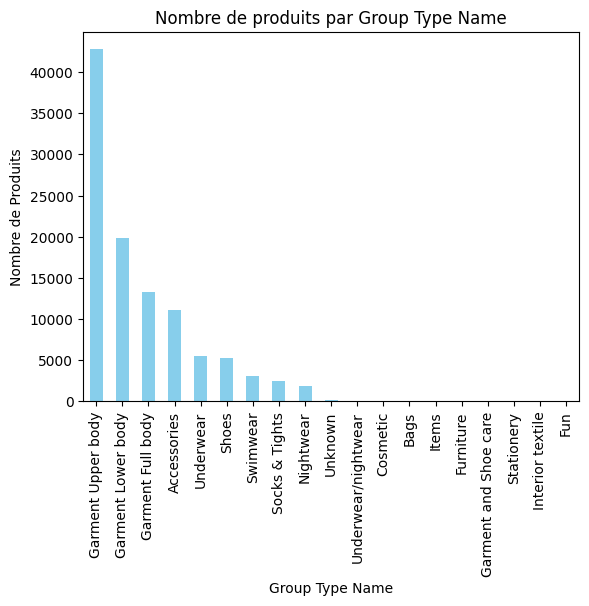

In [ ]:
count_by_type_name = dfarticles['product_group_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_type_name.reset_index()
count_df.columns = ['Group Type Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Group Type Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Group Type Name')
plt.xlabel('Group Type Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head(100)

,Group Type Name,Number of Products
0,Garment Upper body,42741
1,Garment Lower body,19812
2,Garment Full body,13292
3,Accessories,11158
4,Underwear,5490
5,Shoes,5283
6,Swimwear,3127
7,Socks & Tights,2442
8,Nightwear,1899
9,Unknown,121


<Figure size 1200x800 with 0 Axes>

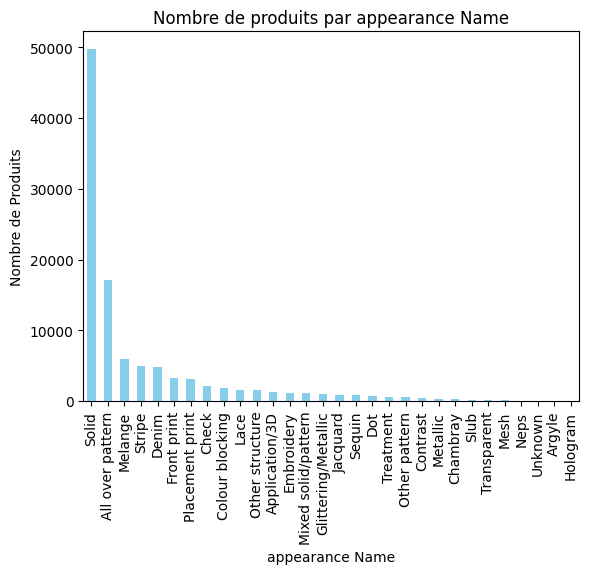

In [ ]:
count_by_appearance_name = dfarticles['graphical_appearance_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_appearance_name.reset_index()
count_df.columns = ['appearance Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='appearance Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par appearance Name')
plt.xlabel('appearance Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head (100)

,appearance Name,Number of Products
0,Solid,49747
1,All over pattern,17165
2,Melange,5938
3,Stripe,4990
4,Denim,4842
5,Front print,3215
6,Placement print,3098
7,Check,2178
8,Colour blocking,1830
9,Lace,1513


<Figure size 1200x800 with 0 Axes>

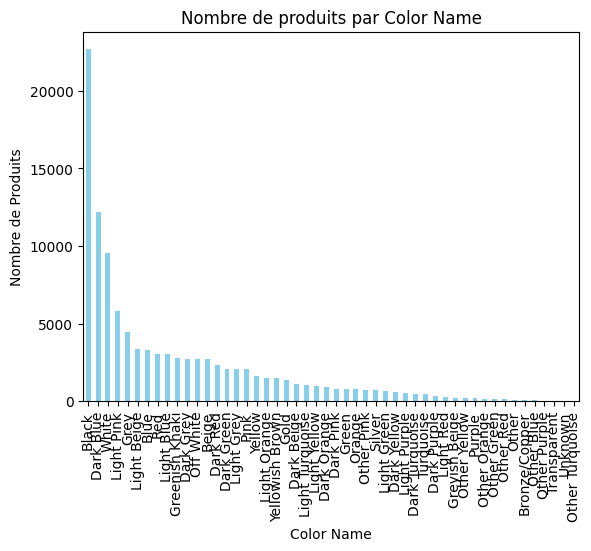

In [ ]:
count_by_color_name = dfarticles['colour_group_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_color_name.reset_index()
count_df.columns = ['Color Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Color Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Color Name')
plt.xlabel('Color Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head(100)

,Color Name,Number of Products
0,Black,22670
1,Dark Blue,12171
2,White,9542
3,Light Pink,5811
4,Grey,4487
5,Light Beige,3356
6,Blue,3308
7,Red,3056
8,Light Blue,3012
9,Greenish Khaki,2767


<Figure size 1200x800 with 0 Axes>

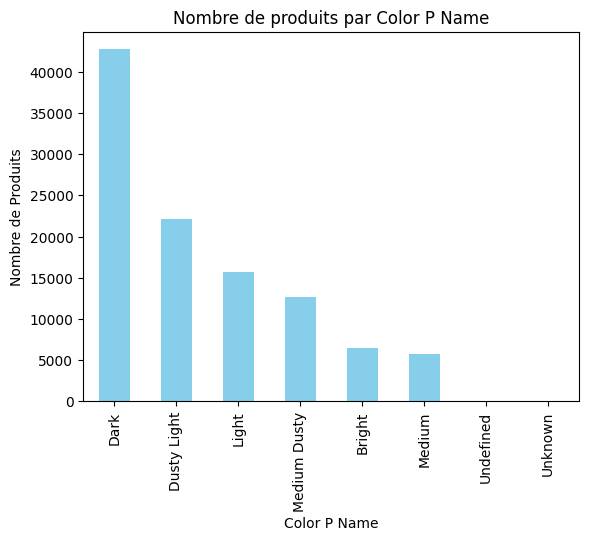

In [ ]:
count_by_color_perceived_name = dfarticles['perceived_colour_value_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_color_perceived_name.reset_index()
count_df.columns = ['Color P Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Color P Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Color PName')
plt.xlabel('Color P Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head(100)

,Color P Name,Number of Products
0,Dark,42706
1,Dusty Light,22152
2,Light,15739
3,Medium Dusty,12630
4,Bright,6471
5,Medium,5711
6,Undefined,105
7,Unknown,28


<Figure size 1200x800 with 0 Axes>

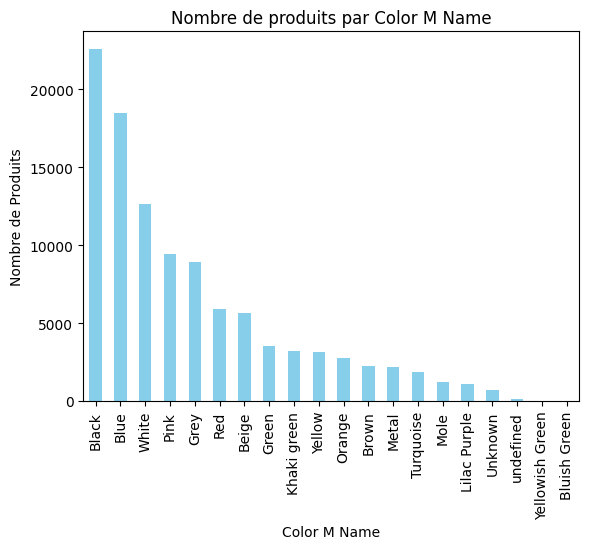

In [ ]:
count_by_color_master_name = dfarticles['perceived_colour_master_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_color_master_name.reset_index()
count_df.columns = ['Color M Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Color M Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Color M Name')
plt.xlabel('Color M Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head(100)

,Color M Name,Number of Products
0,Black,22585
1,Blue,18469
2,White,12665
3,Pink,9403
4,Grey,8924
5,Red,5878
6,Beige,5657
7,Green,3526
8,Khaki green,3181
9,Yellow,3121


In [ ]:
count_by_department_name = dfarticles['department_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_department_name.reset_index()
count_df.columns = ['Dept Name', 'Number of Products']

count_df.head(1000)

,Dept Name,Number of Products
0,Jersey,4604
1,Knitwear,3503
2,Trouser,2655
3,Blouse,2362
4,Dress,2087
...,...,...
245,Woven bottoms inactive from S.7,1
246,Jersey inactive from S.6,1
247,EQ Divided Blue,1
248,Accessories Other,1


<Figure size 1200x800 with 0 Axes>

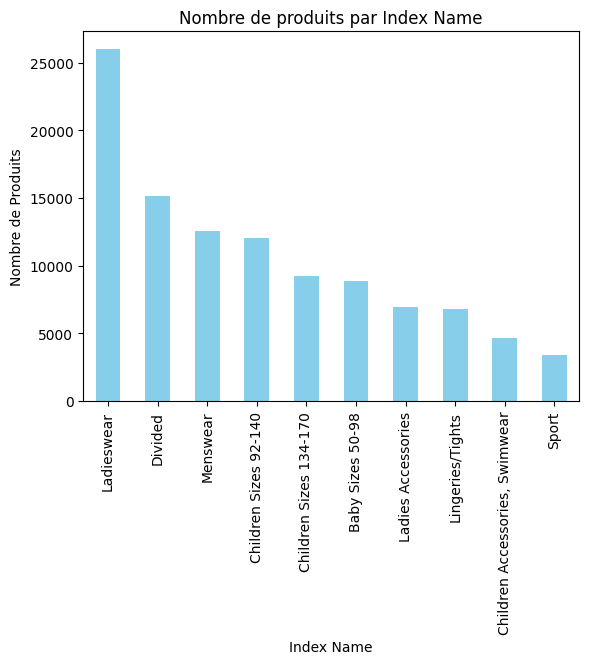

In [ ]:
count_by_index_name = dfarticles['index_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_index_name.reset_index()
count_df.columns = ['Index Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Index Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Index Name')
plt.xlabel('Index Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()


<Figure size 1200x800 with 0 Axes>

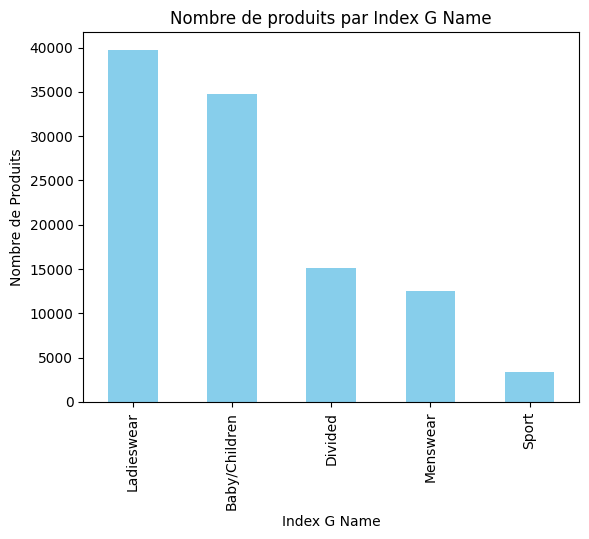

In [ ]:
count_by_index_group_name = dfarticles['index_group_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_index_group_name.reset_index()
count_df.columns = ['Index G Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Index G Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Index G Name')
plt.xlabel('Index G Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_nonzero = (product_popularity['transaction_count'] > 0).sum()
print(count_nonzero)


104547


In [ ]:
count_by_section_name = dfarticles['section_name'].value_counts()

count_df = count_by_section_name.reset_index()
count_df.columns = ['Section Name', 'Number of Products']

count_df.head(1000)

,Section Name,Number of Products
0,Womens Everyday Collection,7295
1,Divided Collection,7124
2,Baby Essentials & Complements,4932
3,Kids Girl,4469
4,Young Girl,3899
5,Womens Lingerie,3598
6,Girls Underwear & Basics,3490
7,Womens Tailoring,3376
8,Kids Boy,3328
9,Womens Small accessories,3270


<Figure size 1200x800 with 0 Axes>

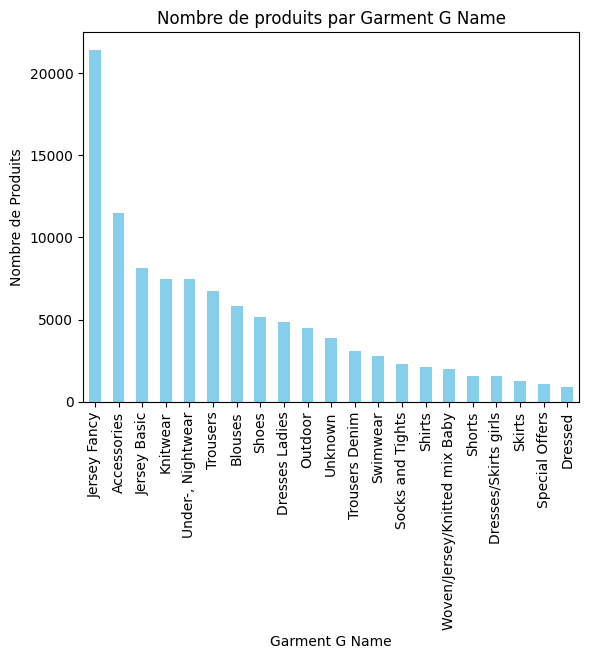

In [ ]:
count_by_garment_group_name = dfarticles['garment_group_name'].value_counts()

# Créer un DataFrame à partir des résultats pour faciliter la visualisation
count_df = count_by_garment_group_name.reset_index()
count_df.columns = ['Garment G Name', 'Number of Products']

# Visualisation avec un graphique en barres
plt.figure(figsize=(12, 8))
count_df.plot(kind='bar', x='Garment G Name', y='Number of Products', legend=False, color='skyblue')

plt.title('Nombre de produits par Garment G Name')
plt.xlabel('Garment G Name')
plt.ylabel('Nombre de Produits')
plt.xticks(rotation=90)  # Rotation des labels pour meilleure lisibilité
plt.show()

In [ ]:
count_df.head(1000)

,Garment G Name,Number of Products
0,Jersey Fancy,21445
1,Accessories,11519
2,Jersey Basic,8126
3,Knitwear,7490
4,"Under-, Nightwear",7441
5,Trousers,6727
6,Blouses,5838
7,Shoes,5145
8,Dresses Ladies,4874
9,Outdoor,4501


### Observations



**La question du choix optimum du nombre de dimensions a une réponse empirique: trop de features augmenterai l'espace de représentation, demanderai un temps de calcul important et peut aboutir sur une absence de rapprochement entre item, tandis que trop peu de features ne permettrai pas d'identifier les similarités entre produit générant ainsi des recommendations trop vaguement proche des attentes du client. Une règle simple va guider le choix : pour 10 puissane k données, on se limite à k feature.**

Vu les valeurs possibles et leur distributions, le choix ultérieur pour les items embbedings :  la **couleur master** à la place du groupe de couleur, l'**index groupe** au lieu de l'index pour maintenir l'information avec des valeurs limitées et normalisées.


L'ordre des champs selon un regroupement fonctionnel :    

-- Identification de l'item
*   article_id  : avec 105542 valeurs distinctes, c'est la clé primaire à utiliser pour les jointures.
*   product_code : toujours valorisé, identique pour désigner un item qui existe en plusieurs motifs/couleurs/tailles.
*   product_name : label titre commercial correspondant au champ code corrélé.
    **Remarque :** à normaliser si utilisé pour un calcul de similarité car parfois des labels sont répétés avec des variantes de textes tout en désignant la même chose.
*   detail_desc: Texte libre avec au maximum 764 caractères pour décrire l'item et son usage. Champ bien valorisé avec seulement 0.1% de valeurs manquantes.

-- Catégorisation de l'item
*   product_type_no/product_type_name : 132 types différents qui permettent de catégoriser les items.  Champ très spécifique pour rapprocher les items entre eux. Chaque type appartient à un seul et unique group excepté le produit "Umbrella".
*   product_group_name: 19 valeurs différentes pour regrouper les différents type d'items. 9 groupe ayant plus de 1000 produits et 10 groupe ayant d'une centaine de produit à 2 produit dans le catalogue. Pour ces 10 groupe, surtout ceux ayant très peu de produit, la similarité sera limitée. Le groupe est indépendant de l'acheteur. Par exemple, on y trouve des vêtements haut du corps, quelque soit l'âge/le sexe.
*   department_no/department_name: 250 valeurs différentes pour décrire le groupe d'items. Ce champ n'est pas normalisé. Par exemple, on a 27 item de département incluant Jersey, avec deux département différent pour Jersey Fancy ou Jersey fancy. Parfois, on a le même nom qui désigne plusieurs code de département.

*   garment_group_no/garment_group_name: 20 valeurs normalisées qui regroupent la notion de département. Par exemple, on ne trouve plus que deux garnment Jersey Basic ou Fancy.

-- Propriétés de l'item
*   graphical_appearance_no/graphical_appearance_name: 30 valeurs différentes pour décrire l'aspect visuel de l'item.
*   colour_group_code/colour_group_name: 50 valeurs différentes pour décrire la couleur de l'item. Les valeurs semblent être répétitive : par exemple Orange/Other Orange.
*   perceived_colour_value_id/perceived_colour_value_name: 8 groupes de valeurs différentes pour décrire la teinte de l'item.
*   perceived_colour_master_id/perceived_colour_master_name: 20 valeurs différentes pour décrire la couleur de l'item. Ce champ sera à privilégier pour la dimension de couleur car normalisé et toujours valorisé.

-- Cible de l'item
*   index_code/index_name: 10 valeurs différentes se répartissent le catalogue. L'index nous sert à identifier pour quel type de client l'item est fait : femme, enfant, bébé, homme, mixte, sportif. etc. Champ normalisé.

*   index_group_no/index_group_name: 5 valeurs différentes se synthétisent le champ index. Par exemple, au lieu d'avoir 4 index en fonction de la taille de l'enfant, un seul group sera utilisé pour identifier les items enfants.

*   section_no/section_name: 56 valeurs différents qui combinent le profil de l'acheteur avec un groupe d'item détaillé. Par exemple, femme basics/tailoring/underware...etc.  Excepté le champ Men Other et Other 2 le champ est normalisé.



## Transactions

Nous avons 31 millions de transactions sur une période de deux ans.

In [9]:
dftx = pd.read_csv('/content/drive/MyDrive/0-ME-IASD/Recommendation/Lab/Projet/transactions_train.csv')
dftx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31788324 entries, 0 to 31788323
Data columns (total 5 columns):
 #   Column            Dtype  
---  ------            -----  
 0   t_dat             object 
 1   customer_id       object 
 2   article_id        int64  
 3   price             float64
 4   sales_channel_id  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.2+ GB


### Rapport

In [ ]:
profile = ProfileReport(dftx, title="Transactions Dataset", html={'style': {'full_width': True}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Analyse détaillée

#### Métrique de consommation

In [10]:
nb_clients_uniques = dftx['customer_id'].nunique()
nb_clients = dfclient['customer_id'].nunique()
print(f"Nombre de clients différents ayant acheté au moins un produit : {nb_clients_uniques}")
print(f"Proportion de clients différents ayant acheté au moins un produit : {nb_clients_uniques/nb_clients * 100}%")

Nombre de clients différents ayant acheté au moins un produit : 1362281
Proportion de clients différents ayant acheté au moins un produit : 99.29306549658158%


In [11]:
nb_articles_uniques = dftx['article_id'].nunique()
nb_articles = dfarticles['article_id'].nunique()
print(f"Nombre d'artciles ayant été acheté au moins une fois : {nb_articles_uniques}")
print(f"Proportion d'artciles ayant été acheté au moins une fois: {nb_articles_uniques/nb_articles * 100}%")

Nombre d'artciles ayant été acheté au moins une fois : 104547
Proportion d'artciles ayant été acheté au moins une fois: 99.05724735176517%


In [12]:
total_articles_per_client = dftx.groupby('customer_id').size()
distinct_articles_per_client = dftx.groupby('customer_id')['article_id'].nunique()

mean_articles_per_client = total_articles_per_client.mean()
mean_distinct_articles_per_client = distinct_articles_per_client.mean()

print(f"Nombre moyen d'articles achetés par client : {mean_articles_per_client}")
print(f"Nombre moyen d'articles distincts achetés par client : {mean_distinct_articles_per_client}")


Nombre moyen d'articles achetés par client : 23.334630667241193
Nombre moyen d'articles distincts achetés par client : 20.04464497412795


Distributions des interactions

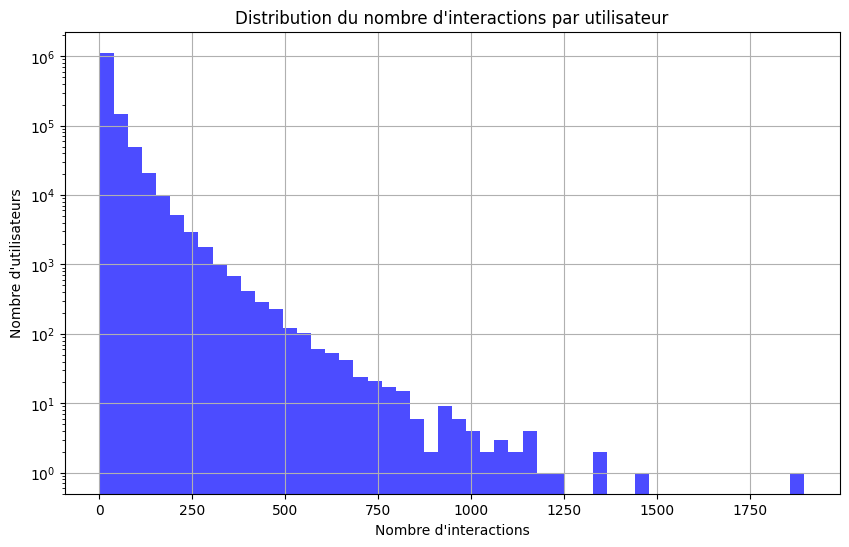

In [13]:
interaction_counts = dftx.groupby('customer_id').size()


plt.figure(figsize=(10, 6))
plt.hist(interaction_counts, bins=50, color='blue', alpha=0.7)
plt.title('Distribution du nombre d\'interactions par utilisateur')
plt.xlabel('Nombre d\'interactions')
plt.ylabel('Nombre d\'utilisateurs')
plt.yscale('log')  # Échelle logarithmique pour mieux voir les écarts
plt.grid(True)
plt.show()

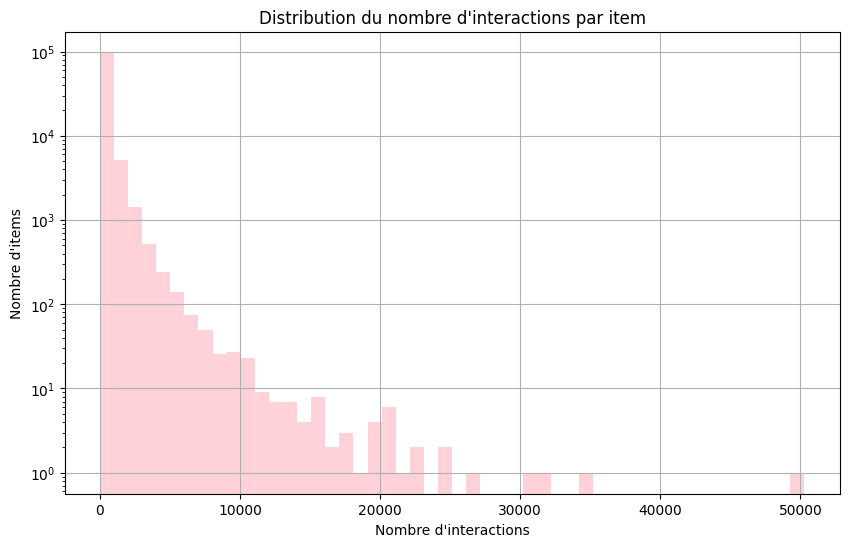

In [ ]:
interaction_counts = dftx.groupby('article_id').size()


plt.figure(figsize=(10, 6))
plt.hist(interaction_counts, bins=50, color='pink', alpha=0.7)
plt.title('Distribution du nombre d\'interactions par item')
plt.xlabel('Nombre d\'interactions')
plt.ylabel('Nombre d\'items')
plt.yscale('log')  # Échelle logarithmique pour mieux voir les écarts
plt.grid(True)
plt.show()

#### Habitude d'achat

In [14]:
# Période des transactions
min_date = dftx['t_dat'].min()
max_date = dftx['t_dat'].max()
print(f"Date de début des transactions : {min_date}")
print(f"Date de fin des transactions : {max_date}")

Date de début des transactions : 2018-09-20
Date de fin des transactions : 2020-09-22


In [16]:
df_merged = pd.merge(dftx, dfarticles, on='article_id', how='inner')
purchase_counts = df_merged.groupby(['customer_id', 'product_code']).size().reset_index(name='purchase_count')


In [17]:
purchase_counts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24414690 entries, 0 to 24414689
Data columns (total 3 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   customer_id     object
 1   product_code    int64 
 2   purchase_count  int64 
dtypes: int64(2), object(1)
memory usage: 558.8+ MB


In [18]:
# les achats avec plus d'un product_code
purchase_counts = purchase_counts[purchase_counts['purchase_count'] > 1]
#nombre d'achat avec plus d'un product code
total_purchases = len(purchase_counts)
print(f"Nombre total de transactions multiple: {total_purchases}")

Nombre total de transactions multiple: 4946329


In [19]:
# Liste des product_code faisant partie des achats avec plus d'un product code
product_codes_with_multiple_purchases = purchase_counts['product_code'].unique()
print(f"Nombre de product_code faisant partie des achats avec plus d'un product code : {len(product_codes_with_multiple_purchases)}")
# Liste avec la description de detail_desc
product_codes_with_multiple_purchases_detail=pd.merge(purchase_counts, dfarticles, on='product_code', how='inner')
product_codes_with_multiple_purchases_detail.head(1000)

Nombre de product_code faisant partie des achats avec plus d'un product code : 38718


,customer_id,product_code,purchase_count,article_id,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,568601,3,568601006,Mariette Blazer,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
1,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,568601,3,568601007,Mariette Blazer,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
2,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,568601,3,568601008,Mariette,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
3,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,568601,3,568601012,Mariette,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
4,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,568601,3,568601013,Mariette,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0000b2f1829e23b24feec422ef13df3ccedaedc85368e6...,706016,2,706016038,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
996,0000b2f1829e23b24feec422ef13df3ccedaedc85368e6...,706016,2,706016039,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
997,0000b2f1829e23b24feec422ef13df3ccedaedc85368e6...,706016,2,706016050,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
998,0000b2f1829e23b24feec422ef13df3ccedaedc85368e6...,706016,2,706016053,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...


In [20]:
# On compte le nombre d'achats pour chaque client et chaque article
purchase_counts = dftx.groupby(['customer_id', 'article_id']).size().reset_index(name='purchase_count')

# Filtrer pour obtenir les articles achetés plus d'une fois par le même client
repeated_purchases = purchase_counts[purchase_counts['purchase_count'] > 1]

# Nombre total de clients qui ont acheté au moins un article plusieurs fois
total_clients_with_repeated_purchases = repeated_purchases['customer_id'].nunique()

# Nombre moyen d'articles répétés par client
mean_repeated_articles_per_client = repeated_purchases.groupby('customer_id').size().mean()

print(f'Proportion de clients ayant acheté au moins un article plusieurs fois : {total_clients_with_repeated_purchases*100/distinct_clients}')
print(f'Nombre total des clients ayant acheté au moins un article plusieurs fois : {total_clients_with_repeated_purchases}/')
print(f'Nombre moyen d\'articles achetés plusieurs fois par client : {mean_repeated_articles_per_client:.2f}')
print(f'Nombre des transactions répétées : {len(repeated_purchases)}')
print(f'Proportion des transactions répétées : {len(repeated_purchases)*100/len(dftx)}')


Proportion de clients ayant acheté au moins un article plusieurs fois : 49.207542349926335
Nombre total des clients ayant acheté au moins un article plusieurs fois : 670345/
Nombre moyen d'articles achetés plusieurs fois par client : 5.24
Nombre des transactions répétées : 3515413
Proportion des transactions répétées : 11.05881832587336


1 client sur 2 a déjà acheté le même item en l'espace de deux années.

Etonamment ces achats répétitifs ne concernent pas un type de produit limité (exemple : chaussettes/underware). Au contraire, il couvre la quasi totalité des product_code du catalogue.

Soit le dataset a été préparée avec une offuscation qui a cet effet de bord, soit dans le monde du textile la moitié des clients d'H&M achètent des articles en double.

D'après cette analyse et pour rester conforme au niveau d'évaluation du modèle, nous n'allons pas exclure de recommander les précédents achats.

### Observations

31 millions de transactions sur une période de deux ans représente une volumétrie suffisante pour réaliser une approche collaborative filtering basé sur un calcul de similarité.

Avec une représentativité de 99% du catalogue item et du listing clients, le dataset est a une bonne couverture de données.

En supposant qu'un traitement préalable est fait pour identifier les nouveaux clients / grey sheep pour qui les rapprochement ne sont pas possibles, 3 options sont proposés en **recommandation non personnalisée** : des palmarès (court ou long) contextuel (mois de connexion) ou absolu (basé sur la popularité) avec un filtrage sur des articles ayant un prix de vente supérieure à la moyenne.  




## Recommandations non personnalisées

#### Popularité produit

In [23]:
product_popularity = dftx.groupby('article_id')['t_dat'].count().reset_index(name='transaction_count')
product_popularity = pd.merge(dfarticles[['article_id']], product_popularity, on='article_id', how='left')
product_popularity['transaction_count'].fillna(0, inplace=True)
product_popularity = product_popularity.sort_values(by='transaction_count', ascending=False)
product_popularity['rank'] = range(1, len(product_popularity) + 1)
product_popularity.head(110000)

<ipython-input-23-67d324e61156>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  product_popularity['transaction_count'].fillna(0, inplace=True)


,article_id,transaction_count,rank
53892,706016001,50287.0,1
53893,706016002,35043.0,2
1713,372860001,31718.0,3
24837,610776002,30199.0,4
70221,759871002,26329.0,5
...,...,...,...
104688,926010001,0.0,105538
101382,896195002,0.0,105539
103927,917203001,0.0,105540
103928,917203003,0.0,105541


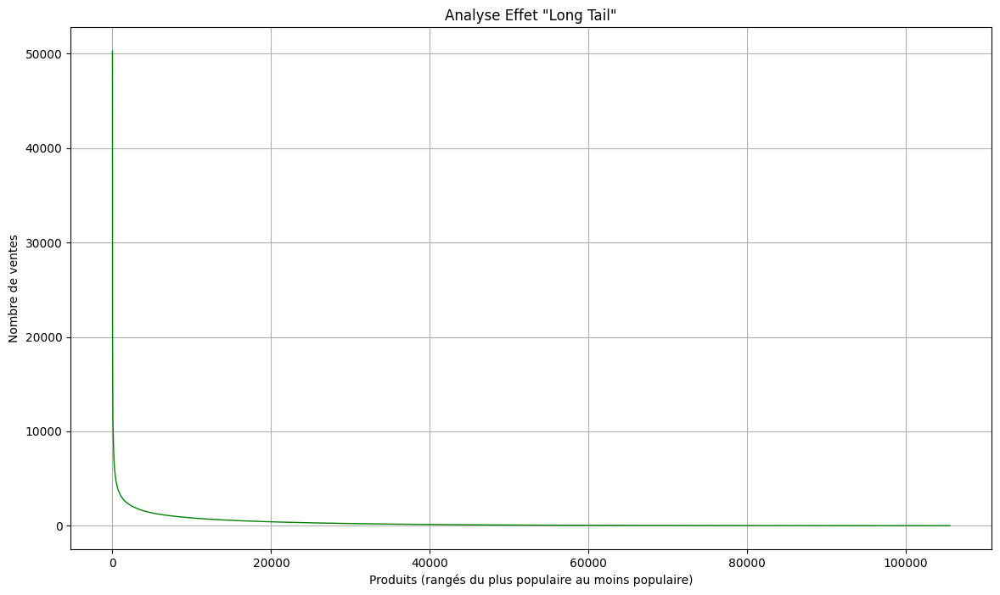

In [24]:
plt.figure(figsize=(14, 8))
plt.plot(product_popularity['rank'], product_popularity['transaction_count'], color='green', linewidth=1)
plt.xlabel('Produits (rangés du plus populaire au moins populaire)')
plt.ylabel('Nombre de ventes')
plt.title('Analyse Effet "Long Tail"')
plt.grid(True)
plt.show()


Ce graphe confirme l'effet "Long tail" des ventes : sur les deux années, on observe un quasi 80/20 de consommation du catalogue. 80% des produits ont été commandés moins de 410 fois en deux ans. Les items qui sont peu ou pas consommés seront rarement recommandés si on choisit une approches 100% CF. Nous allons nous orienter vers une approche hybride, en ajoutant le CBF de l'item on aura plus de chance d'augmenter la couverture du catalogue dans les recommandations.

In [25]:
threshold_rank = 20000
transactions_at_threshold = product_popularity.loc[product_popularity['rank'] == threshold_rank, 'transaction_count'].values[0]
print("Nombre de transactions pour le produit de rang 20000 :", transactions_at_threshold)


Nombre de transactions pour le produit de rang 20000 : 410.0


#### Palmarès long absolu

Quelque soit la solution de recommandation choisie, le nouvel utilisateur ne peut pas profiter de CF ou CBF. Dans ce cas (**cold start**), on va proposer une solution non personnalisé basé sur un Palmarès.

On présume que le prix de vente évolue en fonction des opérations marketing/période donc on produit une moyenne du prix sur l'ensemble des ventes.

In [26]:
article_sales = dftx.groupby('article_id').agg(
    transaction_count=('t_dat', 'count'),
    average_price=('price', 'mean')
).reset_index()

top_ten_articles = article_sales.sort_values(by='transaction_count', ascending=False).head(10)
top_ten_detailed = pd.merge(top_ten_articles, dfarticles, on='article_id', how='left')

top_ten_detailed.head(10)

,article_id,transaction_count,average_price,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,706016001,50287,0.032448,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
1,706016002,35043,0.032426,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
2,372860001,31718,0.012958,372860,7p Basic Shaftless,302,Socks,Socks & Tights,1010016,Solid,...,Shopbasket Socks,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,Fine-knit trainer socks in a soft cotton blend.
3,610776002,30199,0.008083,610776,Tilly (1),255,T-shirt,Garment Upper body,1010016,Solid,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,T-shirt in lightweight jersey with a rounded h...
4,759871002,26329,0.005605,759871,Tilda tank,253,Vest top,Garment Upper body,1010016,Solid,...,EQ Divided Basics,D,Divided,2,Divided,80,Divided Complements Other,1002,Jersey Basic,"Cropped, fitted top in cotton jersey with narr..."
5,464297007,25025,0.016192,464297,Greta Thong Mynta Low 3p,286,Underwear bottom,Underwear,1010014,Placement print,...,Casual Lingerie,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear",Thong briefs in cotton jersey with a wide lace...
6,372860002,24458,0.012155,372860,7p Basic Shaftless,302,Socks,Socks & Tights,1010016,Solid,...,Shopbasket Socks,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,Fine-knit trainer socks in a soft cotton blend.
7,610776001,22451,0.008079,610776,Tilly (1),255,T-shirt,Garment Upper body,1010016,Solid,...,Jersey Basic,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,T-shirt in lightweight jersey with a rounded h...
8,399223001,22236,0.030873,399223,Curvy Jeggings HW Ankle,272,Trousers,Garment Lower body,1010016,Solid,...,Denim Trousers,D,Divided,2,Divided,57,Ladies Denim,1016,Trousers Denim,"Jeggings in washed, superstretch denim with a ..."
9,706016003,21241,0.032588,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...


On améliore le palmarès en recommandant des produits dont le prix de vente est supérieur à la moyenne. Ce choix est fait dans une tactique d'objectif d'augmenter le chiffre d'affaire. En l'absence de la valorisation de la marge, on prends simplement le prix.

In [27]:

filtered_articles = article_sales[article_sales['average_price'] > 0.02540678]
top_ten_articles = filtered_articles.sort_values(by='transaction_count', ascending=False).head(10)
top_ten_detailed = pd.merge(top_ten_articles, dfarticles, on='article_id', how='left')
top_ten_detailed.head(10)

,article_id,transaction_count,average_price,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,706016001,50287,0.032448,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
1,706016002,35043,0.032426,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
2,399223001,22236,0.030873,399223,Curvy Jeggings HW Ankle,272,Trousers,Garment Lower body,1010016,Solid,...,Denim Trousers,D,Divided,2,Divided,57,Ladies Denim,1016,Trousers Denim,"Jeggings in washed, superstretch denim with a ..."
3,706016003,21241,0.032588,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
4,720125001,21063,0.032455,720125,SUPREME RW tights,273,Leggings/Tights,Garment Lower body,1010016,Solid,...,Ladies Sport Bottoms,S,Sport,26,Sport,5,Ladies H&M Sport,1005,Jersey Fancy,Sports tights in fast-drying functional fabric...
5,562245046,20719,0.031672,562245,Luna skinny RW,272,Trousers,Garment Lower body,1010016,Solid,...,Trouser,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1009,Trousers,"5-pocket jeans in washed, superstretch denim w..."
6,562245001,20464,0.026179,562245,Luna skinny RW,272,Trousers,Garment Lower body,1010016,Solid,...,Trouser,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1009,Trousers,"5-pocket jeans in washed, superstretch denim w..."
7,568601006,19379,0.048468,568601,Mariette Blazer,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
8,448509014,19216,0.040668,448509,Perrie Slim Mom Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,"5-pocket, ankle-length jeans in washed, sturdy..."
9,751471001,18263,0.032341,751471,Pluto RW slacks (1),272,Trousers,Garment Lower body,1010016,Solid,...,Trouser,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1009,Trousers,Ankle-length cigarette trousers in a stretch w...


Le palmarès précédent présente certains produit en plusieurs variations. Pour améliorer la diversification on va choisir une variante pour chaque produit dans le palmarès.

In [28]:
filtered_articles = article_sales[article_sales['average_price'] > 0.02540678]
filtered_articles_detailed = pd.merge(filtered_articles, dfarticles, on='article_id', how='left')
max_transaction_per_product = filtered_articles_detailed.loc[
    filtered_articles_detailed.groupby('product_code')['transaction_count'].idxmax()
]
top_articles_sorted = max_transaction_per_product.sort_values(by='transaction_count', ascending=False)

top_ten_articles = top_articles_sorted.head(10)
top_ten_articles.head(10)

,article_id,transaction_count,average_price,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
18515,706016001,50287,0.032448,706016,Jade HW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,High-waisted jeans in washed superstretch deni...
429,399223001,22236,0.030873,399223,Curvy Jeggings HW Ankle,272,Trousers,Garment Lower body,1010016,Solid,...,Denim Trousers,D,Divided,2,Divided,57,Ladies Denim,1016,Trousers Denim,"Jeggings in washed, superstretch denim with a ..."
20541,720125001,21063,0.032455,720125,SUPREME RW tights,273,Leggings/Tights,Garment Lower body,1010016,Solid,...,Ladies Sport Bottoms,S,Sport,26,Sport,5,Ladies H&M Sport,1005,Jersey Fancy,Sports tights in fast-drying functional fabric...
4038,562245046,20719,0.031672,562245,Luna skinny RW,272,Trousers,Garment Lower body,1010016,Solid,...,Trouser,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1009,Trousers,"5-pocket jeans in washed, superstretch denim w..."
4424,568601006,19379,0.048468,568601,Mariette Blazer,264,Blazer,Garment Upper body,1010016,Solid,...,Suit,A,Ladieswear,1,Ladieswear,11,Womens Tailoring,1008,Dressed,Fitted jacket in woven fabric with notch lapel...
687,448509014,19216,0.040668,448509,Perrie Slim Mom Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,"5-pocket, ankle-length jeans in washed, sturdy..."
24512,751471001,18263,0.032341,751471,Pluto RW slacks (1),272,Trousers,Garment Lower body,1010016,Solid,...,Trouser,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1009,Trousers,Ankle-length cigarette trousers in a stretch w...
5974,590928001,15906,0.029158,590928,New Girl Push Top,298,Bikini top,Swimwear,1010026,Other structure,...,Swimwear,B,Lingeries/Tights,1,Ladieswear,60,"Womens Swimwear, beachwear",1018,Swimwear,"Lined, push-up triangle bikini top with moulde..."
3461,554450001,15245,0.032408,554450,Julia RW Skinny Denim TRS,272,Trousers,Garment Lower body,1010016,Solid,...,Trousers,D,Divided,2,Divided,53,Divided Collection,1009,Trousers,5-pocket jeans in superstretch washed denim wi...
23148,741356002,14454,0.032675,741356,Pamela Shorts HW,274,Shorts,Garment Lower body,1010023,Denim,...,Shorts,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1025,Shorts,"Short, 5-pocket shorts in washed denim with a ..."


#### Palmarès court relatif au contexte

Pour les affichages avec peu d'espace, on optera pour 3 produits. Dans cette variante, on dégage les tendances d'achat par mois pour recommander des produits en fonction du mois courant.

In [29]:
dftx['t_dat'] = pd.to_datetime(dftx['t_dat'])
dftx['month'] = dftx['t_dat'].dt.month

article_counts = dftx.groupby(['month', 'article_id']).size().reset_index(name='order_count')
top_3_articles = article_counts.groupby('month').apply(lambda x: x.nlargest(3, 'order_count')).reset_index(drop=True)

top_3_articles.head(100)

<ipython-input-29-24f68c0b6276>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_3_articles = article_counts.groupby('month').apply(lambda x: x.nlargest(3, 'order_count')).reset_index(drop=True)


,month,article_id,order_count
0,1,689109001,5715
1,1,706016001,5453
2,1,692930001,4314
3,2,706016001,4499
4,2,706016002,3641
5,2,372860001,2902
6,3,706016001,5122
7,3,706016002,3872
8,3,372860001,2768
9,4,610776002,5213


# Préparation des données pour le ML

## Encodage

Le Customer ID est une donnée de type objet qui n'est pas optimisée pour des tâches d'apprentissage. On le transforme en numérique.

In [21]:
label_encoder = LabelEncoder()
dfclient['customer_id_encoded'] = label_encoder.fit_transform(dfclient['customer_id'])
dfclient.head()

,customer_id,FN,Active,club_member_status,fashion_news_frequency,age,postal_code,customer_id_encoded
0,00000dbacae5abe5e23885899a1fa44253a17956c6d1c3...,NaN,NaN,ACTIVE,NONE,49.0,52043ee2162cf5aa7ee79974281641c6f11a68d276429a...,0
1,0000423b00ade91418cceaf3b26c6af3dd342b51fd051e...,NaN,NaN,ACTIVE,NONE,25.0,2973abc54daa8a5f8ccfe9362140c63247c5eee03f1d93...,1
2,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,NaN,NaN,ACTIVE,NONE,24.0,64f17e6a330a85798e4998f62d0930d14db8db1c054af6...,2
3,00005ca1c9ed5f5146b52ac8639a40ca9d57aeff4d1bd2...,NaN,NaN,ACTIVE,NONE,54.0,5d36574f52495e81f019b680c843c443bd343d5ca5b1c2...,3
4,00006413d8573cd20ed7128e53b7b13819fe5cfc2d801f...,1.0,1.0,ACTIVE,Regularly,52.0,25fa5ddee9aac01b35208d01736e57942317d756b32ddd...,4


Application de la transformation au dataset des interactions.

In [22]:
dftx = dftx.merge(dfclient[['customer_id', 'customer_id_encoded']], on='customer_id', how='left')
dftx.head()

,t_dat,customer_id,article_id,price,sales_channel_id,customer_id_encoded
0,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,663713001,0.050831,2,2
1,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,541518023,0.030492,2,2
2,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,505221004,0.015237,2,7
3,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,685687003,0.016932,2,7
4,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,685687004,0.016932,2,7


## Echantillonage

In [30]:
interactions_per_user = dftx.groupby('customer_id_encoded').size()

paliers = (50,100,250,300,350,400,500,1000)

for i, threshold in enumerate(paliers, 1):
    users_threshold = interactions_per_user[interactions_per_user >= threshold].index

    # Filtrer dftx pour ces utilisateurs
    filtered_dftx = dftx[dftx['customer_id_encoded'].isin(users_threshold)]

    # Compter le nombre de transactions
    num_transactions = len(filtered_dftx)

    # Compter le nombre de clients uniques
    num_unique_clients = filtered_dftx['customer_id_encoded'].nunique()

    # Afficher les résultats pour chaque seuil
    print(f"Filtre {i} (au moins {threshold} interactions) :")
    print(f"Nombre de transactions : {num_transactions}")
    print(f"Nombre de clients uniques : {num_unique_clients}\n")

Filtre 1 (au moins 50 interactions) :
Nombre de transactions : 17555456
Nombre de clients uniques : 175792

Filtre 2 (au moins 100 interactions) :
Nombre de transactions : 9413225
Nombre de clients uniques : 57266

Filtre 3 (au moins 250 interactions) :
Nombre de transactions : 2075642
Nombre de clients uniques : 6010

Filtre 4 (au moins 300 interactions) :
Nombre de transactions : 1336909
Nombre de clients uniques : 3292

Filtre 5 (au moins 350 interactions) :
Nombre de transactions : 904190
Nombre de clients uniques : 1946

Filtre 6 (au moins 400 interactions) :
Nombre de transactions : 630949
Nombre de clients uniques : 1209

Filtre 7 (au moins 500 interactions) :
Nombre de transactions : 307782
Nombre de clients uniques : 478

Filtre 8 (au moins 1000 interactions) :
Nombre de transactions : 23760
Nombre de clients uniques : 20



In [31]:
def get_subset(df, number):
    """
        just get a subset of a large dataset for debug purpose
    """
    users_threshold = interactions_per_user[interactions_per_user >= number].index
    df_subset = df[df['customer_id_encoded'].isin(users_threshold)]
    print(f"Nombre de transactions : {len(df_subset)}")
    print(f"Nombre de clients uniques : {df_subset['customer_id_encoded'].nunique()}")

    return df_subset

In [32]:
tx_sub = get_subset(dftx, 500)

Nombre de transactions : 307782
Nombre de clients uniques : 478


## Groupement des achats

Comme nous avons des habitudes d'achat avec plusieurs fois le même article id dans beaucoup de cas, cela implique soit d'utiliser le temps comme dimension de prévision ou d'aggéger les données pour ne pas répéter des séquences entre l'entrainement et le test pour le modèle.

In [33]:
txagg_sub = tx_sub.groupby(['customer_id_encoded', 'article_id']).size().reset_index(name='count')


In [34]:
txagg_sub.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 217950 entries, 0 to 217949
Data columns (total 3 columns):
 #   Column               Non-Null Count   Dtype
---  ------               --------------   -----
 0   customer_id_encoded  217950 non-null  int64
 1   article_id           217950 non-null  int64
 2   count                217950 non-null  int64
dtypes: int64(3)
memory usage: 5.0 MB


## Client-Item sparse matrice

Les données de transactions dont nous disposons sont explicites et représentent les interactions positives entre les clients et les items. Pour appliquer un apprentissage, le modèle aura besoin de la représentation globale pour chacun des clients sur l'ensemble du catalogue.

Light FM a besoin de travailler sur des indices non nulls et consécutifs : on doit donc énumérer puis associer les énumérations avec les identifiants précédent avant de faire le produit cartésien des items/users.

La méthode Dataset() de la libraire light fm permets de construire cette matrice.

In [35]:
dataset = Dataset()
dataset.fit(txagg_sub['customer_id_encoded'],
            txagg_sub['article_id'])

In [36]:
dataset.interactions_shape()

(478, 50584)

Création de la matrice sparse à partir du produit cartésien, l'interaction sera valorisée à 1 si elle existe,  à 0 en cas d'absence, weights est initialisé par défaut à 1. Nous n'allons pas inclure la majoration d'un poids sur les achats multiples.

In [37]:
(interactions, weights) = dataset.build_interactions(((row['customer_id_encoded'], row['article_id'])
                                                      for index, row in txagg_sub.iterrows()))

print(repr(interactions))

<478x50584 sparse matrix of type '<class 'numpy.int32'>'
	with 217950 stored elements in COOrdinate format>


In [ ]:
subset_user_idx = np.arange(10)  # 10 premiers utilisateurs
subset_article_idx = np.arange(10)  # 10 premiers articles

# Conversion d'une partie de la matrice creuse en dense pour visualiser
interaction_subset = interactions.tocsr()[subset_user_idx, :][:, subset_article_idx].todense()

print(interaction_subset)

[[1 1 1 1 1 1 1 1 1 1]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 1 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


# Collaborative filtering

## Train/Test

In [38]:
train, test = random_train_test_split(interactions, test_percentage=0.2, random_state=1)

## Interactions Model Train

In [39]:
model = LightFM(learning_rate=0.05, loss='warp')
model.fit(train, epochs=60)

## Evaluation

In [40]:
train_precision = precision_at_k(model, train, k=10).mean()
test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()

train_auc = auc_score(model, train).mean()
test_auc = auc_score(model, test, train_interactions=train).mean()

print('Precision: train %.2f, test %.2f.' % (train_precision, test_precision))
print('AUC: train %.2f, test %.2f.' % (train_auc, test_auc))

Precision: train 0.11, test 0.02.
AUC: train 0.95, test 0.66.


## Fine-tuning

In [ ]:
# Listes des paramètres à itérer
learning_rates = [0.05, 0.025, 0.01, 0.005, 0.001]
losses = ['warp', 'bpr']
learning_schedules = ['adagrad', 'adadelta']

# Dictionnaire pour stocker les résultats
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM(learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Entraîner le modèle
            model.fit(train, epochs=30)

            # Calculer la précision @k pour train et test
            train_precision = precision_at_k(model, train, k=10).mean()
            test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()

            # Calculer l'AUC pour train et test
            train_auc = auc_score(model, train).mean()
            test_auc = auc_score(model, test, train_interactions=train).mean()

            # Stocker les résultats dans le dictionnaire
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision': train_precision,
                'test_precision': test_precision,
                'train_auc': train_auc,
                'test_auc': test_auc
            }

# Afficher les résultats pour chaque configuration
for config, metrics in results.items():
    print(f'Configuration: {config}')
    print(f"Precision: train {metrics['train_precision']:.2f}, test {metrics['test_precision']:.2f}")
    print(f"AUC: train {metrics['train_auc']:.2f}, test {metrics['test_auc']:.2f}")
    print('-' * 40)


Configuration: lr=0.05, loss=warp, schedule=adagrad
Precision: train 1.00, test 0.01
AUC: train 1.00, test 0.45
----------------------------------------
Configuration: lr=0.05, loss=warp, schedule=adadelta
Precision: train 0.96, test 0.02
AUC: train 1.00, test 0.52
----------------------------------------
Configuration: lr=0.05, loss=bpr, schedule=adagrad
Precision: train 0.99, test 0.00
AUC: train 1.00, test 0.53
----------------------------------------
Configuration: lr=0.05, loss=bpr, schedule=adadelta
Precision: train 0.96, test 0.03
AUC: train 1.00, test 0.54
----------------------------------------
Configuration: lr=0.025, loss=warp, schedule=adagrad
Precision: train 1.00, test 0.00
AUC: train 1.00, test 0.45
----------------------------------------
Configuration: lr=0.025, loss=warp, schedule=adadelta
Precision: train 1.00, test 0.01
AUC: train 1.00, test 0.51
----------------------------------------
Configuration: lr=0.025, loss=bpr, schedule=adagrad
Precision: train 0.99, test

## Train avec les meilleurs hyper paramètres

Analyse de convergence des métriques de résultats avec une augmentation progressive du nombre d'époch avec deux target :
- une précision @10 au moins de 0.1/0.2 avec la recommendations d'au moins 1 à 2 produits dans la liste.
- AUC (Area Under Curve) la capacité du modèle à classer correctement les articles pertinents par rapport aux articles non pertinents au moins > 0,5 pour faire mieux qu'un classement aléatoire.

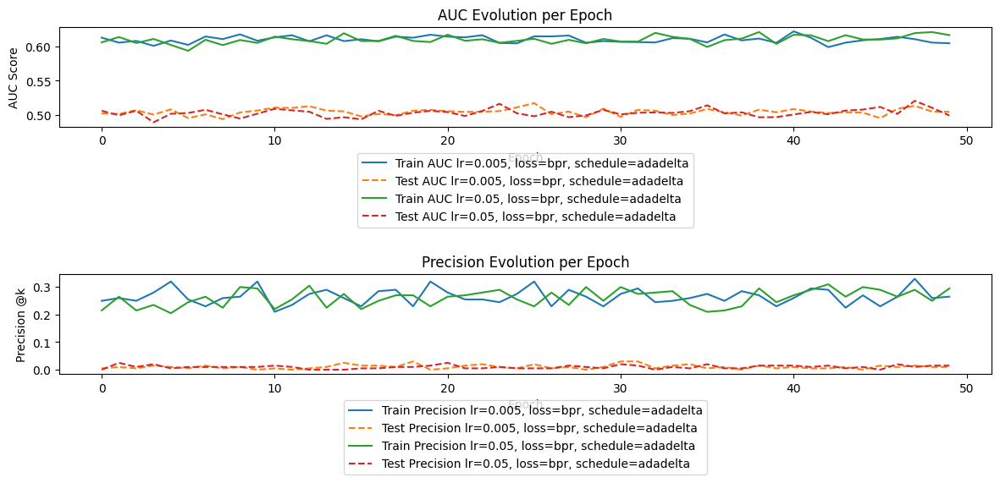

In [ ]:
learning_rates = [0.005, 0.05]
losses = ['bpr']
learning_schedules = ['adadelta']
epochs = 50  # Nombre d'époques

# Dictionnaire pour stocker les résultats pour chaque configuration
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM(learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Listes pour stocker les métriques par époque
            train_precision_history = []
            test_precision_history = []
            train_auc_history = []
            test_auc_history = []

            # Entraînement du modèle pour chaque époque
            for epoch in range(epochs):
                # Entraîner le modèle pour une époque
                model.fit(train, epochs=1, verbose=False)

                # Calculer la précision @k pour train et test
                train_precision = precision_at_k(model, train, k=10).mean()
                test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()

                # Calculer l'AUC pour train et test
                train_auc = auc_score(model, train).mean()
                test_auc = auc_score(model, test, train_interactions=train).mean()

                # Stocker les métriques pour cette époque
                train_precision_history.append(train_precision)
                test_precision_history.append(test_precision)
                train_auc_history.append(train_auc)
                test_auc_history.append(test_auc)

            # Stocker les résultats pour cette configuration
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision_history': train_precision_history,
                'test_precision_history': test_precision_history,
                'train_auc_history': train_auc_history,
                'test_auc_history': test_auc_history
            }

# Visualisation des résultats
plt.figure(figsize=(12, 6))

# Plot AUC par époque pour chaque configuration
plt.subplot(2,1,1)
for config, metrics in results.items():
    plt.plot(metrics['train_auc_history'], label=f'Train AUC {config}')
    plt.plot(metrics['test_auc_history'], '--', label=f'Test AUC {config}')
plt.title('AUC Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('AUC Score')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Plot Précision par époque pour chaque configuration
plt.subplot(2,1,2)
for config, metrics in results.items():
    plt.plot(metrics['train_precision_history'], label=f'Train Precision {config}')
    plt.plot(metrics['test_precision_history'], '--', label=f'Test Precision {config}')
plt.title('Precision Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Precision @k')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Affichage des plots
plt.tight_layout()
plt.show()


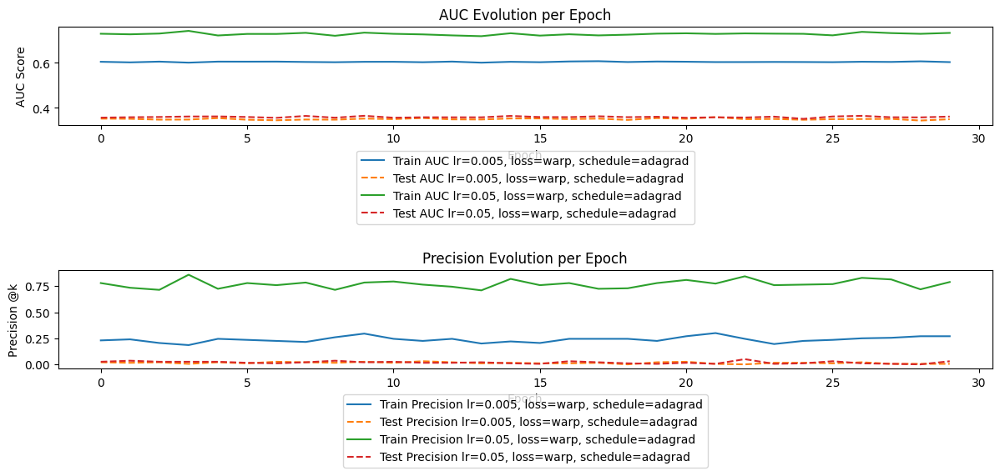

In [ ]:
learning_rates = [0.005, 0.05]
losses = ['warp']
learning_schedules = ['adagrad']
epochs = 30  # Nombre d'époques

# Dictionnaire pour stocker les résultats pour chaque configuration
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM(learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Listes pour stocker les métriques par époque
            train_precision_history = []
            test_precision_history = []
            train_auc_history = []
            test_auc_history = []

            # Entraînement du modèle pour chaque époque
            for epoch in range(epochs):
                # Entraîner le modèle pour une époque
                model.fit(train, epochs=1, verbose=False)

                # Calculer la précision @k pour train et test
                train_precision = precision_at_k(model, train, k=10).mean()
                test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()

                # Calculer l'AUC pour train et test
                train_auc = auc_score(model, train).mean()
                test_auc = auc_score(model, test, train_interactions=train).mean()

                # Stocker les métriques pour cette époque
                train_precision_history.append(train_precision)
                test_precision_history.append(test_precision)
                train_auc_history.append(train_auc)
                test_auc_history.append(test_auc)

            # Stocker les résultats pour cette configuration
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision_history': train_precision_history,
                'test_precision_history': test_precision_history,
                'train_auc_history': train_auc_history,
                'test_auc_history': test_auc_history
            }

# Visualisation des résultats
plt.figure(figsize=(12, 6))

# Plot AUC par époque pour chaque configuration
plt.subplot(2,1,1)
for config, metrics in results.items():
    plt.plot(metrics['train_auc_history'], label=f'Train AUC {config}')
    plt.plot(metrics['test_auc_history'], '--', label=f'Test AUC {config}')
plt.title('AUC Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('AUC Score')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Plot Précision par époque pour chaque configuration
plt.subplot(2,1,2)
for config, metrics in results.items():
    plt.plot(metrics['train_precision_history'], label=f'Train Precision {config}')
    plt.plot(metrics['test_precision_history'], '--', label=f'Test Precision {config}')
plt.title('Precision Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Precision @k')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Affichage des plots
plt.tight_layout()
plt.show()


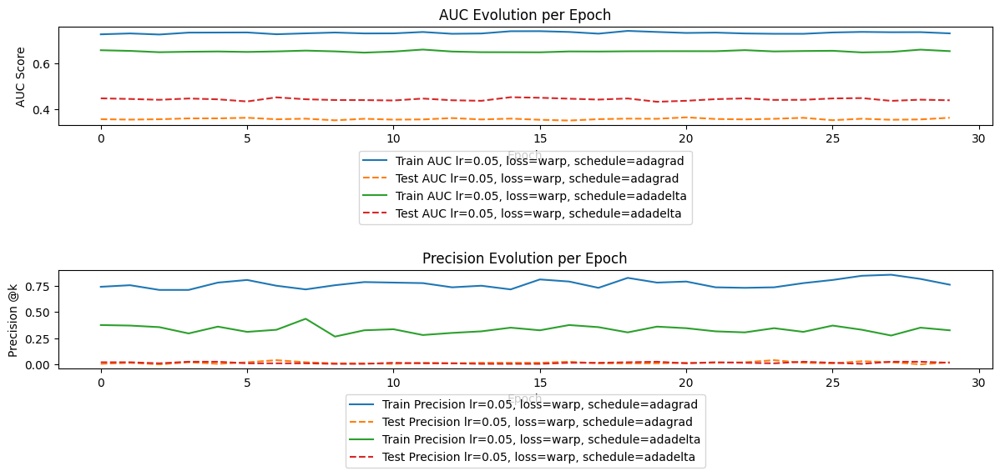

In [ ]:
learning_rates = [0.05]
losses = ['warp']
learning_schedules = ['adagrad','adadelta']
epochs = 30  # Nombre d'époques

# Dictionnaire pour stocker les résultats pour chaque configuration
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM(learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Listes pour stocker les métriques par époque
            train_precision_history = []
            test_precision_history = []
            test_precision_5_history = []
            test_precision_15_history = []
            train_auc_history = []
            test_auc_history = []

            # Entraînement du modèle pour chaque époque
            for epoch in range(epochs):
                # Entraîner le modèle pour une époque
                model.fit(train, epochs=1, verbose=False)

                # Calculer la précision @k pour train et test
                train_precision = precision_at_k(model, train, k=10).mean()
                test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()
                test_precision_5 = precision_at_k(model, test, k=5, train_interactions=train).mean()
                test_precision_15 = precision_at_k(model, test, k=15, train_interactions=train).mean()

                # Calculer l'AUC pour train et test
                train_auc = auc_score(model, train).mean()
                test_auc = auc_score(model, test, train_interactions=train).mean()

                # Stocker les métriques pour cette époque
                train_precision_history.append(train_precision)
                test_precision_history.append(test_precision)
                test_precision_5_history.append(test_precision_5)
                test_precision_15_history.append(test_precision_15)
                train_auc_history.append(train_auc)
                test_auc_history.append(test_auc)

            # Stocker les résultats pour cette configuration
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision_history': train_precision_history,
                'test_precision_history': test_precision_history,
                'test_precision_5_history': test_precision_5_history,
                'test_precision_15_history': test_precision_15_history,
                'train_auc_history': train_auc_history,
                'test_auc_history': test_auc_history
            }

# Visualisation des résultats
plt.figure(figsize=(12, 6))

# Plot AUC par époque pour chaque configuration
plt.subplot(2,1,1)
for config, metrics in results.items():
    plt.plot(metrics['train_auc_history'], label=f'Train AUC {config}')
    plt.plot(metrics['test_auc_history'], '--', label=f'Test AUC {config}')
plt.title('AUC Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('AUC Score')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Plot Précision par époque pour chaque configuration
plt.subplot(2,1,2)
for config, metrics in results.items():
    plt.plot(metrics['train_precision_history'], label=f'Train Precision {config}')
    plt.plot(metrics['test_precision_history'], '--', label=f'Test Precision {config}')
plt.title('Precision Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Precision @k')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Affichage des plots
plt.tight_layout()
plt.show()


In [ ]:

# Trouver les paramètres pour la meilleure précision et AUC sur le test set
best_precision = -1
best_precision_5 = -1
best_precision_15 = -1
best_auc = -1
best_precision_config = None
best_auc_config = None

# Parcourir toutes les configurations
for config, metrics in results.items():
    # Trouver la précision maximale dans test_precision_history
    max_test_precision = max(metrics['test_precision_history'])
    if max_test_precision > best_precision:
        best_precision = max_test_precision
        best_precision_config = config
    max_test_precision_5 = max(metrics['test_precision_5_history'])
    if max_test_precision_5 > best_precision_5:
        best_precision_5 = max_test_precision_5
        best_precision_5_config = config
    max_test_precision_15 = max(metrics['test_precision_15_history'])
    if max_test_precision_15 > best_precision_15:
        best_precision_15 = max_test_precision_15
        best_precision_15_config = config

    # Trouver la valeur AUC maximale dans test_auc_history
    max_test_auc = max(metrics['test_auc_history'])
    if max_test_auc > best_auc:
        best_auc = max_test_auc
        best_auc_config = config

# Afficher les résultats
print(f"Meilleure précision @10: {best_precision:.4f} obtenue avec les paramètres : {best_precision_config}")
print(f"Meilleure précision @5: {best_precision_5:.4f} obtenue avec les paramètres : {best_precision_5_config}")
print(f"Meilleure précision @15: {best_precision_15:.4f} obtenue avec les paramètres : {best_precision_15_config}")
print(f"Meilleure AUC test: {best_auc:.4f} obtenue avec les paramètres : {best_auc_config}")


Meilleure précision @10: 0.0400 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @5: 0.0500 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @15: 0.0367 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure AUC test: 0.4525 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adadelta


La différence entre l'accuracy de train et de test est peut-être dûe à un sur-apprentissage.

Le set de données réduit ou peu représentatif,

Le caractère sparse des données et/ou

un nombre d'époque élevé peuvent y concourir.

L'amélioration passe pas le changement de ces paramètres et/ou l'ajout d'une régularisation dans le modèle lui même.

La librairie LightFM ne supporte plus l'option earlystopping qui évalue le point optimum pour le nombre d'époque.


model = LightFM(loss='warp', item_alpha=1e-6, user_alpha=1e-6)

model = LightFM(no_components=20, loss='warp')
Essayez des valeurs plus petites (par exemple, 10, 20, 50), plutôt que des valeurs très élevées (comme 100 ou plus).


## Extension dataset

Palier 1.

In [41]:
tx_sub = get_subset(dftx, 400)
txagg_sub = tx_sub.groupby(['customer_id_encoded', 'article_id']).size().reset_index(name='count')
dataset = Dataset()
dataset.fit(txagg_sub['customer_id_encoded'],
            txagg_sub['article_id'])
(interactions, weights) = dataset.build_interactions(((row['customer_id_encoded'], row['article_id'])
                                                      for index, row in txagg_sub.iterrows()))

print(repr(interactions))


Nombre de transactions : 630949
Nombre de clients uniques : 1209
<1209x62739 sparse matrix of type '<class 'numpy.int32'>'
	with 460576 stored elements in COOrdinate format>


In [42]:
train, test = random_train_test_split(interactions, test_percentage=0.2, random_state=1)

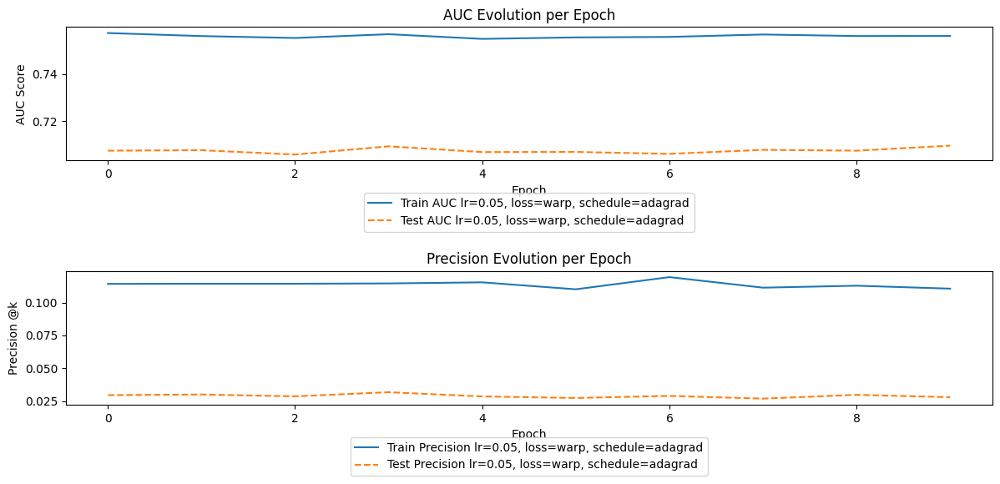

In [52]:
learning_rates = [0.05]
losses = ['warp']
learning_schedules = ['adagrad']
epochs = 10  # Nombre d'époques
#no_components=20,
# Dictionnaire pour stocker les résultats pour chaque configuration
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM( learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Listes pour stocker les métriques par époque
            train_precision_history = []
            test_precision_history = []
            test_precision_5_history = []
            test_precision_15_history = []
            train_auc_history = []
            test_auc_history = []

            # Entraînement du modèle pour chaque époque
            for epoch in range(epochs):
                # Entraîner le modèle pour une époque
                model.fit(train, epochs=1, verbose=False)

                # Calculer la précision @k pour train et test
                train_precision = precision_at_k(model, train, k=10).mean()
                test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()
                test_precision_5 = precision_at_k(model, test, k=5, train_interactions=train).mean()
                test_precision_15 = precision_at_k(model, test, k=15, train_interactions=train).mean()

                # Calculer l'AUC pour train et test
                train_auc = auc_score(model, train).mean()
                test_auc = auc_score(model, test, train_interactions=train).mean()

                # Stocker les métriques pour cette époque
                train_precision_history.append(train_precision)
                test_precision_history.append(test_precision)
                test_precision_5_history.append(test_precision_5)
                test_precision_15_history.append(test_precision_15)
                train_auc_history.append(train_auc)
                test_auc_history.append(test_auc)

            # Stocker les résultats pour cette configuration
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision_history': train_precision_history,
                'test_precision_history': test_precision_history,
                'test_precision_5_history': test_precision_5_history,
                'test_precision_15_history': test_precision_15_history,
                'train_auc_history': train_auc_history,
                'test_auc_history': test_auc_history
            }

# Visualisation des résultats
plt.figure(figsize=(12, 6))

# Plot AUC par époque pour chaque configuration
plt.subplot(2,1,1)
for config, metrics in results.items():
    plt.plot(metrics['train_auc_history'], label=f'Train AUC {config}')
    plt.plot(metrics['test_auc_history'], '--', label=f'Test AUC {config}')
plt.title('AUC Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('AUC Score')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Plot Précision par époque pour chaque configuration
plt.subplot(2,1,2)
for config, metrics in results.items():
    plt.plot(metrics['train_precision_history'], label=f'Train Precision {config}')
    plt.plot(metrics['test_precision_history'], '--', label=f'Test Precision {config}')
plt.title('Precision Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Precision @k')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Affichage des plots
plt.tight_layout()
plt.show()


In [53]:

# Trouver les paramètres pour la meilleure précision et AUC sur le test set
best_precision = -1
best_precision_5 = -1
best_precision_15 = -1
best_auc = -1
best_precision_config = None
best_auc_config = None

# Parcourir toutes les configurations
for config, metrics in results.items():
    # Trouver la précision maximale dans test_precision_history
    max_test_precision = max(metrics['test_precision_history'])
    if max_test_precision > best_precision:
        best_precision = max_test_precision
        best_precision_config = config
    max_test_precision_5 = max(metrics['test_precision_5_history'])
    if max_test_precision_5 > best_precision_5:
        best_precision_5 = max_test_precision_5
        best_precision_5_config = config
    max_test_precision_15 = max(metrics['test_precision_15_history'])
    if max_test_precision_15 > best_precision_15:
        best_precision_15 = max_test_precision_15
        best_precision_15_config = config

    # Trouver la valeur AUC maximale dans test_auc_history
    max_test_auc = max(metrics['test_auc_history'])
    if max_test_auc > best_auc:
        best_auc = max_test_auc
        best_auc_config = config

# Afficher les résultats
print(f"Meilleure précision @10: {best_precision:.4f} obtenue avec les paramètres : {best_precision_config}")
print(f"Meilleure précision @5: {best_precision_5:.4f} obtenue avec les paramètres : {best_precision_5_config}")
print(f"Meilleure précision @15: {best_precision_15:.4f} obtenue avec les paramètres : {best_precision_15_config}")
print(f"Meilleure AUC test: {best_auc:.4f} obtenue avec les paramètres : {best_auc_config}")


Meilleure précision @10: 0.0318 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @5: 0.0364 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @15: 0.0296 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure AUC test: 0.7097 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad


Avec 10 Epoque et un dataset de 600k, la précision n'atteint pas les 0.05 obtenus avec le dataset de 300k avec 30 epochs.

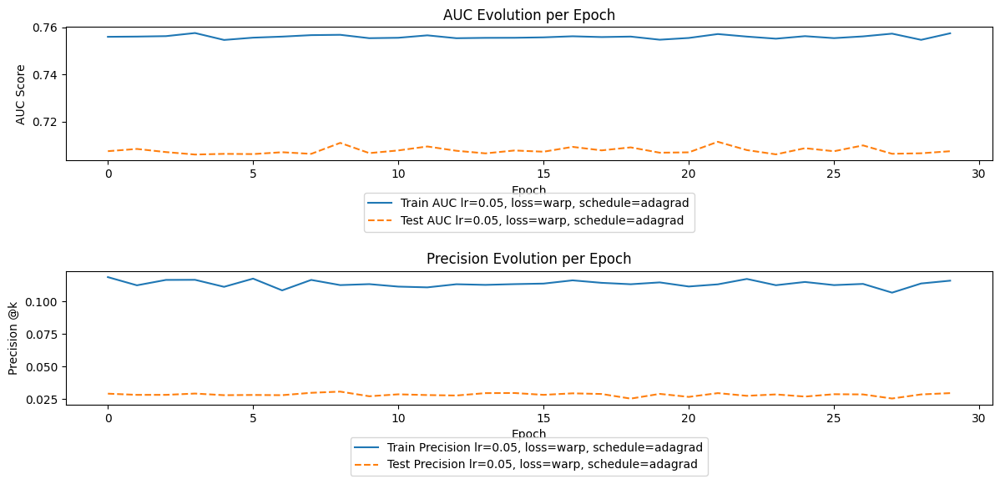

In [54]:
learning_rates = [0.05]
losses = ['warp']
learning_schedules = ['adagrad']
epochs = 30  # Nombre d'époques
#no_components=20,
# Dictionnaire pour stocker les résultats pour chaque configuration
results = {}

# Itération sur chaque combinaison de learning_rate, loss et learning_schedule
for lr in learning_rates:
    for loss in losses:
        for schedule in learning_schedules:
            # Initialiser le modèle LightFM avec les paramètres actuels
            model = LightFM( learning_rate=lr, loss=loss, learning_schedule=schedule)

            # Listes pour stocker les métriques par époque
            train_precision_history = []
            test_precision_history = []
            test_precision_5_history = []
            test_precision_15_history = []
            train_auc_history = []
            test_auc_history = []

            # Entraînement du modèle pour chaque époque
            for epoch in range(epochs):
                # Entraîner le modèle pour une époque
                model.fit(train, epochs=1, verbose=False)

                # Calculer la précision @k pour train et test
                train_precision = precision_at_k(model, train, k=10).mean()
                test_precision = precision_at_k(model, test, k=10, train_interactions=train).mean()
                test_precision_5 = precision_at_k(model, test, k=5, train_interactions=train).mean()
                test_precision_15 = precision_at_k(model, test, k=15, train_interactions=train).mean()

                # Calculer l'AUC pour train et test
                train_auc = auc_score(model, train).mean()
                test_auc = auc_score(model, test, train_interactions=train).mean()

                # Stocker les métriques pour cette époque
                train_precision_history.append(train_precision)
                test_precision_history.append(test_precision)
                test_precision_5_history.append(test_precision_5)
                test_precision_15_history.append(test_precision_15)
                train_auc_history.append(train_auc)
                test_auc_history.append(test_auc)

            # Stocker les résultats pour cette configuration
            config_name = f'lr={lr}, loss={loss}, schedule={schedule}'
            results[config_name] = {
                'train_precision_history': train_precision_history,
                'test_precision_history': test_precision_history,
                'test_precision_5_history': test_precision_5_history,
                'test_precision_15_history': test_precision_15_history,
                'train_auc_history': train_auc_history,
                'test_auc_history': test_auc_history
            }

# Visualisation des résultats
plt.figure(figsize=(12, 6))

# Plot AUC par époque pour chaque configuration
plt.subplot(2,1,1)
for config, metrics in results.items():
    plt.plot(metrics['train_auc_history'], label=f'Train AUC {config}')
    plt.plot(metrics['test_auc_history'], '--', label=f'Test AUC {config}')
plt.title('AUC Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('AUC Score')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Plot Précision par époque pour chaque configuration
plt.subplot(2,1,2)
for config, metrics in results.items():
    plt.plot(metrics['train_precision_history'], label=f'Train Precision {config}')
    plt.plot(metrics['test_precision_history'], '--', label=f'Test Precision {config}')
plt.title('Precision Evolution per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Precision @k')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=1)

# Affichage des plots
plt.tight_layout()
plt.show()


In [55]:

# Trouver les paramètres pour la meilleure précision et AUC sur le test set
best_precision = -1
best_precision_5 = -1
best_precision_15 = -1
best_auc = -1
best_precision_config = None
best_auc_config = None

# Parcourir toutes les configurations
for config, metrics in results.items():
    # Trouver la précision maximale dans test_precision_history
    max_test_precision = max(metrics['test_precision_history'])
    if max_test_precision > best_precision:
        best_precision = max_test_precision
        best_precision_config = config
    max_test_precision_5 = max(metrics['test_precision_5_history'])
    if max_test_precision_5 > best_precision_5:
        best_precision_5 = max_test_precision_5
        best_precision_5_config = config
    max_test_precision_15 = max(metrics['test_precision_15_history'])
    if max_test_precision_15 > best_precision_15:
        best_precision_15 = max_test_precision_15
        best_precision_15_config = config

    # Trouver la valeur AUC maximale dans test_auc_history
    max_test_auc = max(metrics['test_auc_history'])
    if max_test_auc > best_auc:
        best_auc = max_test_auc
        best_auc_config = config

# Afficher les résultats
print(f"Meilleure précision @10: {best_precision:.4f} obtenue avec les paramètres : {best_precision_config}")
print(f"Meilleure précision @5: {best_precision_5:.4f} obtenue avec les paramètres : {best_precision_5_config}")
print(f"Meilleure précision @15: {best_precision_15:.4f} obtenue avec les paramètres : {best_precision_15_config}")
print(f"Meilleure AUC test: {best_auc:.4f} obtenue avec les paramètres : {best_auc_config}")


Meilleure précision @10: 0.0307 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @5: 0.0356 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure précision @15: 0.0292 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad
Meilleure AUC test: 0.7115 obtenue avec les paramètres : lr=0.05, loss=warp, schedule=adagrad


L'augmentation de la taille du dataset n'as pas amélioré la précision à nombre d'epoche égale. En revanche l'AUC est nettement améliorée.

# Content based filtering



## Cosine Similarity avec TF-IDF de la description

Une première piste est d'évaluer la pertinence d'utilisation de la description du champ "Détail" pour en extraire les similarités par analyse de fréquence de mot entre les articles.

In [ ]:
dfarticles['detail_desc'] = dfarticles['detail_desc'].fillna('')
dfarticles_100 = get_subset(dfarticles, 10)
dfarticles_100 = dfarticles_100.reset_index(drop=True)
dfarticles_100.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,department_name,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc
0,595209001,595209,Bali top SW BIG,298,Bikini top,Swimwear,1010001,All over pattern,9,Black,...,Swimwear,B,Lingeries/Tights,1,Ladieswear,60,"Womens Swimwear, beachwear",1018,Swimwear,Fully lined bikini top with lightly padded cup...
1,539366003,539366,Ari,252,Sweater,Garment Upper body,1010002,Application/3D,71,Light Blue,...,Jersey fancy,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1005,Jersey Fancy,Top in sweatshirt fabric with an appliqué on t...
2,639838019,639838,Ta bort,275,Skirt,Garment Lower body,1010004,Check,73,Dark Blue,...,Skirt,A,Ladieswear,1,Ladieswear,15,Womens Everyday Collection,1012,Skirts,"Calf-length, pleated skirt in a patterned weav..."
3,734057001,734057,POWER tights+,273,Leggings/Tights,Garment Lower body,1010001,All over pattern,9,Black,...,Jersey,A,Ladieswear,1,Ladieswear,2,H&M+,1005,Jersey Fancy,Sports tights in fast-drying functional fabric...
4,610059001,610059,Six Feet Under Low Brief,59,Swimwear bottom,Swimwear,1010016,Solid,9,Black,...,Swimwear,B,Lingeries/Tights,1,Ladieswear,60,"Womens Swimwear, beachwear",1018,Swimwear,Fully lined bikini bottoms in sturdy fabric wi...


In [ ]:
tf = TfidfVectorizer(analyzer='word', ngram_range=(1, 1), stop_words='english')
tfidf_matrix = tf.fit_transform(dfarticles_100['detail_desc'])

In [ ]:
print(tfidf_matrix.shape)

(10, 85)


[[0.         0.22818122 0.         0.         0.        ]
 [0.29647062 0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.        ]
 [0.         0.         0.         0.         0.        ]
 [0.         0.24376963 0.28675698 0.         0.        ]]


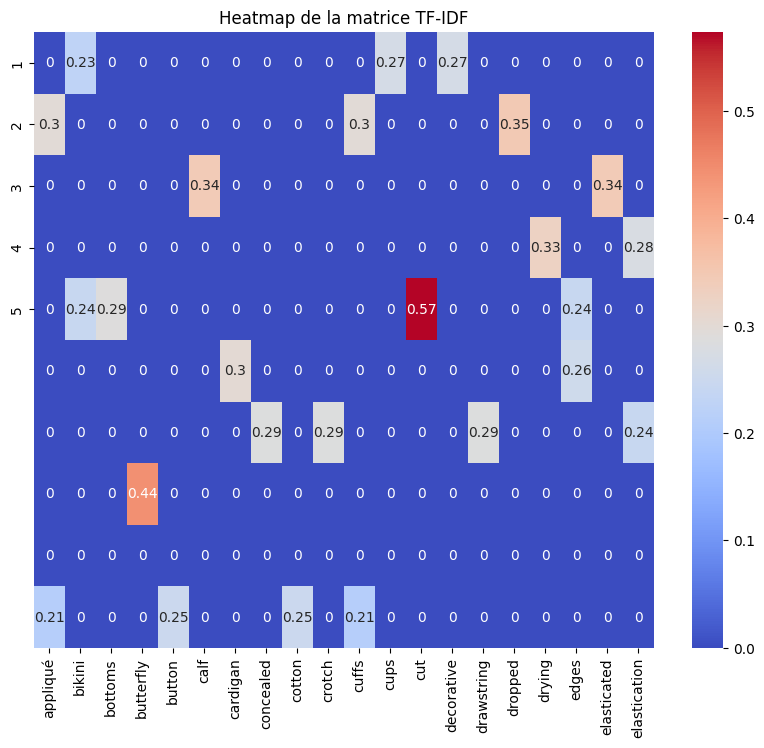

In [ ]:
tfidf_dense = tfidf_matrix.todense()
print(tfidf_dense[:5, :5])

terms = tf.get_feature_names_out()
tfidf_sample = tfidf_dense[:20, :20]
tfidf_sample_df = pd.DataFrame(tfidf_sample, columns=terms[:20])

plt.figure(figsize=(10, 8))
sns.heatmap(tfidf_sample_df, annot=True, cmap="coolwarm", xticklabels=terms[:20], yticklabels=range(1, 6))
plt.title("Heatmap de la matrice TF-IDF")
plt.show()

In [ ]:
cosine_similarities = cosine_similarity(tfidf_matrix, tfidf_matrix)
print(cosine_similarities)

[[1.         0.         0.         0.04830684 0.13185263 0.03538576
  0.04237658 0.         0.34161711 0.        ]
 [0.         1.         0.         0.03270025 0.02882045 0.14663251
  0.13880374 0.17073568 0.         0.40561032]
 [0.         0.         1.         0.04897429 0.04316361 0.
  0.04296209 0.         0.         0.        ]
 [0.04830684 0.03270025 0.04897429 1.         0.06768006 0.0282713
  0.32005546 0.         0.         0.02335788]
 [0.13185263 0.02882045 0.04316361 0.06768006 1.         0.1252023
  0.0593715  0.         0.11443914 0.02058653]
 [0.03538576 0.14663251 0.         0.0282713  0.1252023  1.
  0.13459278 0.         0.05312305 0.11747312]
 [0.04237658 0.13880374 0.04296209 0.32005546 0.0593715  0.13459278
  1.         0.         0.         0.05981915]
 [0.         0.17073568 0.         0.         0.         0.
  0.         1.         0.         0.12195697]
 [0.34161711 0.         0.         0.         0.11443914 0.05312305
  0.         0.         1.         0.0

In [ ]:
results = {}

for idx in range(len(dfarticles_100)):
    similar_indices = cosine_similarities[idx].argsort()[::-1][1:]  # Exclure l'article lui-même
    similar_items = [(cosine_similarities[idx][i], dfarticles_100.loc[i, 'article_id']) for i in similar_indices]

    article_id = dfarticles_100.loc[idx, 'article_id']
    results[article_id] = similar_items

for article_id, similar in results.items():
    print(f"Article {article_id} - articles similaires : {similar}")

Article 595209001 - articles similaires : [(0.3416171122373405, 621287001), (0.13185263456154125, 610059001), (0.04830684380518234, 734057001), (0.042376583982973164, 403844009), (0.035385764016539, 890985002), (0.0, 829909001), (0.0, 734528007), (0.0, 639838019), (0.0, 539366003)]
Article 539366003 - articles similaires : [(0.40561031624663674, 829909001), (0.1707356831259345, 734528007), (0.14663250859848792, 890985002), (0.1388037392157769, 403844009), (0.032700252948906924, 734057001), (0.028820449709885107, 610059001), (0.0, 621287001), (0.0, 639838019), (0.0, 595209001)]
Article 639838019 - articles similaires : [(0.0489742865051739, 734057001), (0.04316360988109881, 610059001), (0.04296208987410696, 403844009), (0.0, 621287001), (0.0, 829909001), (0.0, 890985002), (0.0, 734528007), (0.0, 539366003), (0.0, 595209001)]
Article 734057001 - articles similaires : [(0.32005546224270826, 403844009), (0.06768006295469949, 610059001), (0.0489742865051739, 639838019), (0.04830684380518234

Cette technique est limitée : en effet dans ces cas, la description est proche, mais les articles sont des rayons différents avec une cible marketing différente. De plus au vu du nombre (10k) d'items la matrice tfidf va être très coûteuse à calculer pour l'ensemble.

## Cosine similarity avec BERT embedding de features combinés

L'idée ici est considérer quelques informations clés pour décrire sémantiquement les articles dans l'espace global à partir de troix axes dont les valorisations sont normalisées: le type de vêtement avec deux niveaux de détails (produit et garnment), l'aspect visuel (avec la couleur et le motif), le rayon de vente. On reconstitue une forme plus normalisée et commune de "détail de description" d'item.

In [ ]:
# Combiner les colonnes selectionnées comme pertinentes en une seule phrase
dfarticles['combined_features'] = dfarticles.apply(
    lambda row: f"{row['product_group_name']} {row['garment_group_name']} \
     {row['graphical_appearance_name']} {row['perceived_colour_master_name']} \
      {row['index_group_name']}", axis=1
)
dfarticles.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Bla...
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Whi...
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Stripe Wh...
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Black ..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid White ..."


In [ ]:
df_premiers = dfarticles.head(10)

In [ ]:
sentences = df_premiers['combined_features'].str.split().tolist()
print(sentences[:5])

[['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Solid', 'Black', 'Ladieswear'], ['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Solid', 'White', 'Ladieswear'], ['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Stripe', 'White', 'Ladieswear'], ['Underwear', 'Under-,', 'Nightwear', 'Solid', 'Black', 'Ladieswear'], ['Underwear', 'Under-,', 'Nightwear', 'Solid', 'White', 'Ladieswear']]


In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Mettre BERT en mode évaluation (pas d'entraînement)
model.eval()

# Fonction pour obtenir l'embedding BERT d'un texte
def get_bert_embedding(text):
    # Tokenisation du texte
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    # Passer le texte à travers BERT
    with torch.no_grad():  # Désactive les calculs de gradients
        outputs = model(**inputs)
    # Utiliser l'embedding du token [CLS] comme représentation du texte entier
    cls_embedding = outputs.last_hidden_state[:, 0, :]  # Embedding du premier token [CLS]
    return cls_embedding.squeeze().numpy()

# Obtenir les embeddings BERT pour chaque 'combined_feature'
df_premiers['bert_embedding'] = df_premiers['combined_features'].apply(lambda x: get_bert_embedding(x))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

<ipython-input-12-bf43ca9d6feb>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_premiers['bert_embedding'] = df_premiers['combined_features'].apply(lambda x: get_bert_embedding(x))


In [ ]:
df_premiers.head()

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features,bert_embedding
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Bla...,"[-0.2994682, -0.36190942, -0.49363777, -0.1765..."
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Whi...,"[-0.3023852, -0.34115016, -0.5303644, -0.18427..."
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Stripe Wh...,"[-0.24031642, -0.2799047, -0.5572168, -0.11826..."
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Black ...","[-0.049898386, -0.56770366, -0.5810881, 0.0206..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid White ...","[-0.038013607, -0.5741437, -0.5304289, -0.0059..."


In [ ]:
# Calcul de la similarité cosine entre tous les embeddings
embeddings = df_premiers['bert_embedding'].tolist()
cosine_similarities = cosine_similarity(embeddings)

In [ ]:
results = {}

for idx, row in df_premiers.iterrows():
    # Trier les similarités pour chaque article
    similar_indices = cosine_similarities[idx].argsort()[:-5:-1]  # Top 4 similar items (on exclut l'article lui-même)
    # Stocker les articles similaires avec les scores
    similar_items = [(cosine_similarities[idx][i], df_premiers['article_id'].iloc[i]) for i in similar_indices if i != idx]
    results[row['article_id']] = similar_items



In [ ]:
for article_id, similar in results.items():
    print(f"Article {article_id} is similar to:")
    for score, similar_article_id in similar:
        print(f"  Article {similar_article_id} with similarity score {score:.4f}")

Article 108775015 is similar to:
  Article 108775044 with similarity score 0.9981
  Article 108775051 with similarity score 0.9817
  Article 111586001 with similarity score 0.9454
Article 108775044 is similar to:
  Article 108775015 with similarity score 0.9981
  Article 108775051 with similarity score 0.9847
  Article 111586001 with similarity score 0.9421
Article 108775051 is similar to:
  Article 108775044 with similarity score 0.9847
  Article 108775015 with similarity score 0.9817
  Article 111586001 with similarity score 0.9224
Article 110065001 is similar to:
  Article 110065002 with similarity score 0.9970
  Article 110065011 with similarity score 0.9932
  Article 111586001 with similarity score 0.9476
Article 110065002 is similar to:
  Article 110065001 with similarity score 0.9970
  Article 110065011 with similarity score 0.9910
  Article 111586001 with similarity score 0.9431
Article 110065011 is similar to:
  Article 110065001 with similarity score 0.9932
  Article 11006500

1. Cette technique propose le même article en plusieurs couleurs. En général dans les sites de commerce en ligne, lorsque l'utilisateur regarde un produit qui existe en plusieurs couleurs, elles sont déjà proposées sur la même page. Faire un système de recommandation qui propose le même article dans des couleurs différentes n'as pas beaucoup de valeur ajoutée.
2. Cette technique rapproche des items qui ont le même aspect, même rayon sans être similaire en type.

Une amélioration va consister à ajouter la dimension de description du produit d'une part et d'exclure les items basés sur produits similaires (identifié via le product_code).

In [ ]:
# Combiner les colonnes selectionnées comme pertinentes en une seule phrase en ajoutant la description
dfarticles['combined_features'] = dfarticles.apply(
    lambda row: f"{row['product_group_name']} {row['garment_group_name']} \
     {row['graphical_appearance_name']} {row['perceived_colour_master_name']} \
      {row['index_group_name']}{row['detail_desc']}", axis=1
)
dfarticles.head()
df_premiers = dfarticles.head(10)

In [ ]:
sentences = df_premiers['combined_features'].str.split().tolist()
print(sentences[:5])

[['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Solid', 'Black', 'LadieswearJersey', 'top', 'with', 'narrow', 'shoulder', 'straps.'], ['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Solid', 'White', 'LadieswearJersey', 'top', 'with', 'narrow', 'shoulder', 'straps.'], ['Garment', 'Upper', 'body', 'Jersey', 'Basic', 'Stripe', 'White', 'LadieswearJersey', 'top', 'with', 'narrow', 'shoulder', 'straps.'], ['Underwear', 'Under-,', 'Nightwear', 'Solid', 'Black', 'LadieswearMicrofibre', 'T-shirt', 'bra', 'with', 'underwired,', 'moulded,', 'lightly', 'padded', 'cups', 'that', 'shape', 'the', 'bust', 'and', 'provide', 'good', 'support.', 'Narrow', 'adjustable', 'shoulder', 'straps', 'and', 'a', 'narrow', 'hook-and-eye', 'fastening', 'at', 'the', 'back.', 'Without', 'visible', 'seams', 'for', 'greater', 'comfort.'], ['Underwear', 'Under-,', 'Nightwear', 'Solid', 'White', 'LadieswearMicrofibre', 'T-shirt', 'bra', 'with', 'underwired,', 'moulded,', 'lightly', 'padded', 'cups', 'that', 'shape', '

In [ ]:
# Charger le tokenizer et le modèle BERT pré-entraîné
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Mettre BERT en mode évaluation (pas d'entraînement)
model.eval()

# Fonction pour obtenir l'embedding BERT d'un texte
def get_bert_embedding(text):
    # Tokenisation du texte
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    # Passer le texte à travers BERT
    with torch.no_grad():  # Désactive les calculs de gradients
        outputs = model(**inputs)
    # Utiliser l'embedding du token [CLS] comme représentation du texte entier
    cls_embedding = outputs.last_hidden_state[:, 0, :]  # Embedding du premier token [CLS]
    return cls_embedding.squeeze().numpy()

# Obtenir les embeddings BERT pour chaque 'combined_feature'
df_premiers['bert_embedding'] = df_premiers['combined_features'].apply(lambda x: get_bert_embedding(x))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

<ipython-input-27-ca178513493c>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_premiers['bert_embedding'] = df_premiers['combined_features'].apply(lambda x: get_bert_embedding(x))


In [ ]:
# Calcul de la similarité cosine entre tous les embeddings
embeddings = df_premiers['bert_embedding'].tolist()
cosine_similarities = cosine_similarity(embeddings)

In [ ]:
results = {}

for idx, row in df_premiers.iterrows():
    # Trier les similarités pour chaque article et sélectionner les 10 plus proches (y compris lui-même)
    similar_indices = cosine_similarities[idx].argsort()[:-11:-1]

    filtered_similar_items = []
    for i in similar_indices:
        if i != idx and df_premiers['product_code'].iloc[i] != df_premiers['product_code'].iloc[idx]:
            filtered_similar_items.append((cosine_similarities[idx][i], df_premiers['article_id'].iloc[i]))

    # Limiter le nombre d'articles à 3
    if len(filtered_similar_items) > 3:
        filtered_similar_items = filtered_similar_items[:3]

    # Stocker les similar_items dans le dictionnaire avec l'article_id comme clé
    results[row['article_id']] = filtered_similar_items


In [ ]:
# Afficher les résultats
for article_id, similar in results.items():
    print(f"Article {article_id} is similar to:")
    for score, similar_article_id in similar:
        print(f"  Article {similar_article_id} with similarity score {score:.4f}")

Article 108775015 is similar to:
  Article 111586001 with similarity score 0.9113
  Article 111565001 with similarity score 0.8847
  Article 111565003 with similarity score 0.8807
Article 108775044 is similar to:
  Article 111586001 with similarity score 0.9089
  Article 111565001 with similarity score 0.8833
  Article 111565003 with similarity score 0.8790
Article 108775051 is similar to:
  Article 111586001 with similarity score 0.8827
  Article 111565001 with similarity score 0.8658
  Article 111565003 with similarity score 0.8606
Article 110065001 is similar to:
  Article 111586001 with similarity score 0.9052
  Article 111565001 with similarity score 0.9004
  Article 111565003 with similarity score 0.8975
Article 110065002 is similar to:
  Article 111586001 with similarity score 0.9020
  Article 111565001 with similarity score 0.8995
  Article 111565003 with similarity score 0.8966
Article 110065011 is similar to:
  Article 111586001 with similarity score 0.9029
  Article 11156500

In [ ]:
# Liste d'ID d'articles à filtrer
article_ids_to_filter = [111586001, 111565001, 111565003, 108775015]

# Filtrer dfarticles pour ne garder que les articles dont l'ID est dans article_ids_to_filter
filtered_dfarticles = dfarticles[dfarticles['article_id'].isin(article_ids_to_filter)]


filtered_dfarticles.head(10)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,A,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Bla...
6,111565001,111565,20 den 1p Stockings,304,Underwear Tights,Socks & Tights,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny nylon stockings with a wide, reinfo...",Socks & Tights Socks and Tights Solid Bla...
7,111565003,111565,20 den 1p Stockings,302,Socks,Socks & Tights,1010016,Solid,13,Beige,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny nylon stockings with a wide, reinfo...",Socks & Tights Socks and Tights Solid Bei...
8,111586001,111586,Shape Up 30 den 1p Tights,273,Leggings/Tights,Garment Lower body,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,Tights with built-in support to lift the botto...,Garment Lower body Socks and Tights Solid...


In [ ]:
# Liste d'ID d'articles à filtrer
article_ids_to_filter = [111593001, 110065011, 110065001, 110065002]

# Filtrer dfarticles pour ne garder que les articles dont l'ID est dans article_ids_to_filter
filtered_dfarticles = dfarticles[dfarticles['article_id'].isin(article_ids_to_filter)]


filtered_dfarticles.head(10)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Black ..."
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid White ..."
5,110065011,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,12,Light Beige,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Beige ..."
9,111593001,111593,Support 40 den 1p Tights,304,Underwear Tights,Socks & Tights,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny tights that shape the tummy, thighs...",Socks & Tights Socks and Tights Solid Bla...


Cette amélioration permets de recommander un item basé sur un produit différent que celui en cours mais propose dans les items recommandés le même produit dans plusieurs variation (aspect) dans la liste de recommandation. L'item le plus proche suffit pour avoir une bonne diversité dans les recommandation. On va donc prendre à chaque fois l'item le plus similaire et exclure les variations pour proposer des recommandations différentes aux clients.

In [ ]:
results = {}

for idx, row in df_premiers.iterrows():
    # Trier les similarités pour chaque article et sélectionner les 10 plus proches (y compris lui-même)
    similar_indices = cosine_similarities[idx].argsort()[:-11:-1]

    filtered_similar_items = []

    for i in similar_indices:
        # Récupérer le product_code de l'article candidat
        candidate_product_code = df_premiers['product_code'].iloc[i]

        # Vérifier que l'article n'est pas lui-même et qu'il n'a pas déjà un product_code présent dans la liste
        existing_product_codes = [df_premiers['product_code'].iloc[df_premiers[df_premiers['article_id'] == item_id].index[0]] for _, item_id in filtered_similar_items]

        if i != idx and candidate_product_code != df_premiers['product_code'].iloc[idx] and candidate_product_code not in existing_product_codes:
            filtered_similar_items.append((cosine_similarities[idx][i], df_premiers['article_id'].iloc[i]))

    # Stocker les résultats
    results[row['article_id']] = filtered_similar_items

    # Limiter le nombre d'articles à 3
    if len(filtered_similar_items) > 3:
        filtered_similar_items = filtered_similar_items[:3]

    # Stocker les similar_items dans le dictionnaire avec l'article_id comme clé
    results[row['article_id']] = filtered_similar_items


In [ ]:
# Afficher les résultats
for article_id, similar in results.items():
    print(f"Article {article_id} is similar to:")
    for score, similar_article_id in similar:
        print(f"  Article {similar_article_id} with similarity score {score:.4f}")

Article 108775015 is similar to:
  Article 111586001 with similarity score 0.9113
  Article 111565001 with similarity score 0.8847
  Article 110065001 with similarity score 0.8707
Article 108775044 is similar to:
  Article 111586001 with similarity score 0.9089
  Article 111565001 with similarity score 0.8833
  Article 110065001 with similarity score 0.8685
Article 108775051 is similar to:
  Article 111586001 with similarity score 0.8827
  Article 111565001 with similarity score 0.8658
  Article 110065001 with similarity score 0.8276
Article 110065001 is similar to:
  Article 111586001 with similarity score 0.9052
  Article 111565001 with similarity score 0.9004
  Article 111593001 with similarity score 0.8945
Article 110065002 is similar to:
  Article 111586001 with similarity score 0.9020
  Article 111565001 with similarity score 0.8995
  Article 111593001 with similarity score 0.8935
Article 110065011 is similar to:
  Article 111586001 with similarity score 0.9029
  Article 11156500

In [ ]:
# Liste d'ID d'articles à filtrer
article_ids_to_filter = [111593001, 110065011, 111565003, 111586001]

# Filtrer dfarticles pour ne garder que les articles dont l'ID est dans article_ids_to_filter
filtered_dfarticles = dfarticles[dfarticles['article_id'].isin(article_ids_to_filter)]


filtered_dfarticles.head(10)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_code,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features
5,110065011,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,12,Light Beige,...,B,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Beige ..."
7,111565003,111565,20 den 1p Stockings,302,Socks,Socks & Tights,1010016,Solid,13,Beige,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny nylon stockings with a wide, reinfo...",Socks & Tights Socks and Tights Solid Bei...
8,111586001,111586,Shape Up 30 den 1p Tights,273,Leggings/Tights,Garment Lower body,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,Tights with built-in support to lift the botto...,Garment Lower body Socks and Tights Solid...
9,111593001,111593,Support 40 den 1p Tights,304,Underwear Tights,Socks & Tights,1010016,Solid,9,Black,...,B,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny tights that shape the tummy, thighs...",Socks & Tights Socks and Tights Solid Bla...


Ces ajustements sont satisafaisant : généralisation du calcul de l'embbeding item et de la similarité pour l'ensemble du catalogue avec l'enregistrement de ce calcul en fichier.

In [ ]:
sentences = dfarticles['combined_features'].str.split().tolist()

In [ ]:
# Charger le tokenizer et le modèle BERT pré-entraîné
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Mettre BERT en mode évaluation (pas d'entraînement)
model.eval()

# Fonction pour obtenir l'embedding BERT d'un texte
def get_bert_embedding(text):
    # Tokenisation du texte
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    # Passer le texte à travers BERT
    with torch.no_grad():  # Désactive les calculs de gradients
        outputs = model(**inputs)
    # Utiliser l'embedding du token [CLS] comme représentation du texte entier
    cls_embedding = outputs.last_hidden_state[:, 0, :]  # Embedding du premier token [CLS]
    return cls_embedding.squeeze().numpy()

dfarticles['bert_embedding'] = dfarticles['combined_features'].apply(lambda x: get_bert_embedding(x))
dfarticles.to_csv('dfarticles-bertembedding.csv', index=False)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
# Calcul de la similarité cosine entre tous les embeddings
embeddings = dfarticles['bert_embedding'].tolist()
cosine_similarities = cosine_similarity(embeddings)

NameError: name 'dfarticles' is not defined

# Hybride


## Avec les items features

In [56]:
dfarticle_emb = pd.read_csv('/content/drive/MyDrive/0-ME-IASD/Recommendation/Lab/Projet/dfarticles-bertembedding.csv')
dfarticle_emb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105542 entries, 0 to 105541
Data columns (total 27 columns):
 #   Column                        Non-Null Count   Dtype 
---  ------                        --------------   ----- 
 0   article_id                    105542 non-null  int64 
 1   product_code                  105542 non-null  int64 
 2   prod_name                     105542 non-null  object
 3   product_type_no               105542 non-null  int64 
 4   product_type_name             105542 non-null  object
 5   product_group_name            105542 non-null  object
 6   graphical_appearance_no       105542 non-null  int64 
 7   graphical_appearance_name     105542 non-null  object
 8   colour_group_code             105542 non-null  int64 
 9   colour_group_name             105542 non-null  object
 10  perceived_colour_value_id     105542 non-null  int64 
 11  perceived_colour_value_name   105542 non-null  object
 12  perceived_colour_master_id    105542 non-null  int64 
 13 

In [ ]:
dfarticle_emb.head(10)

,article_id,product_code,prod_name,product_type_no,product_type_name,product_group_name,graphical_appearance_no,graphical_appearance_name,colour_group_code,colour_group_name,...,index_name,index_group_no,index_group_name,section_no,section_name,garment_group_no,garment_group_name,detail_desc,combined_features,bert_embedding
0,108775015,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,9,Black,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Bla...,[-2.99468189e-01 -3.61909419e-01 -4.93637770e-...
1,108775044,108775,Strap top,253,Vest top,Garment Upper body,1010016,Solid,10,White,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Solid Whi...,[-3.02385211e-01 -3.41150165e-01 -5.30364394e-...
2,108775051,108775,Strap top (1),253,Vest top,Garment Upper body,1010017,Stripe,11,Off White,...,Ladieswear,1,Ladieswear,16,Womens Everyday Basics,1002,Jersey Basic,Jersey top with narrow shoulder straps.,Garment Upper body Jersey Basic Stripe Wh...,[-2.40316421e-01 -2.79904693e-01 -5.57216823e-...
3,110065001,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,9,Black,...,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Black ...",[-4.98983860e-02 -5.67703664e-01 -5.81088126e-...
4,110065002,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,10,White,...,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid White ...",[-3.80136073e-02 -5.74143708e-01 -5.30428886e-...
5,110065011,110065,OP T-shirt (Idro),306,Bra,Underwear,1010016,Solid,12,Light Beige,...,Lingeries/Tights,1,Ladieswear,61,Womens Lingerie,1017,"Under-, Nightwear","Microfibre T-shirt bra with underwired, moulde...","Underwear Under-, Nightwear Solid Beige ...",[-9.69890505e-03 -5.23823738e-01 -4.53242362e-...
6,111565001,111565,20 den 1p Stockings,304,Underwear Tights,Socks & Tights,1010016,Solid,9,Black,...,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny nylon stockings with a wide, reinfo...",Socks & Tights Socks and Tights Solid Bla...,[-3.53564359e-02 -6.27022386e-01 -3.44926506e-...
7,111565003,111565,20 den 1p Stockings,302,Socks,Socks & Tights,1010016,Solid,13,Beige,...,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny nylon stockings with a wide, reinfo...",Socks & Tights Socks and Tights Solid Bei...,[-1.95035208e-02 -5.20540178e-01 -2.80999988e-...
8,111586001,111586,Shape Up 30 den 1p Tights,273,Leggings/Tights,Garment Lower body,1010016,Solid,9,Black,...,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,Tights with built-in support to lift the botto...,Garment Lower body Socks and Tights Solid...,[-1.09004654e-01 -6.58680975e-01 -4.41785812e-...
9,111593001,111593,Support 40 den 1p Tights,304,Underwear Tights,Socks & Tights,1010016,Solid,9,Black,...,Lingeries/Tights,1,Ladieswear,62,"Womens Nightwear, Socks & Tigh",1021,Socks and Tights,"Semi shiny tights that shape the tummy, thighs...",Socks & Tights Socks and Tights Solid Bla...,[-3.53564359e-02 -6.27022386e-01 -3.44926506e-...


In [57]:
af, cols, unique_f = [], [], []

for col in ['product_group_name', 'perceived_colour_master_name', 'index_group_name', 'garment_group_name','graphical_appearance_name']:
    cols += [col]*len(dfarticle_emb[col].unique())
    unique_f += list(dfarticle_emb[col].unique())

for x,y in zip(cols, unique_f):
    res = str(x)+ ":" +str(y)
    af.append(res)
    print(res)

product_group_name:Garment Upper body
product_group_name:Underwear
product_group_name:Socks & Tights
product_group_name:Garment Lower body
product_group_name:Accessories
product_group_name:Items
product_group_name:Nightwear
product_group_name:Unknown
product_group_name:Underwear/nightwear
product_group_name:Shoes
product_group_name:Swimwear
product_group_name:Garment Full body
product_group_name:Cosmetic
product_group_name:Interior textile
product_group_name:Bags
product_group_name:Furniture
product_group_name:Garment and Shoe care
product_group_name:Fun
product_group_name:Stationery
perceived_colour_master_name:Black
perceived_colour_master_name:White
perceived_colour_master_name:Beige
perceived_colour_master_name:Grey
perceived_colour_master_name:Blue
perceived_colour_master_name:Pink
perceived_colour_master_name:Lilac Purple
perceived_colour_master_name:Red
perceived_colour_master_name:Mole
perceived_colour_master_name:Orange
perceived_colour_master_name:Metal
perceived_colour_maste

In [58]:
def item_feature_colon_value(my_list):
    """
    Takes as input a list and prepends the columns names to respective values in the list.
    For example: if my_list = [1,1,0,'del'],
    resultant output = ['f1:1', 'f2:1', 'f3:0', 'loc:del']

    """
    result = []
    ll = ['product_group_name:', 'perceived_colour_master_name:', 'index_group_name:', 'garment_group_name:', 'graphical_appearance_name:']
    aa = my_list
    for x,y in zip(ll,aa):
        res = str(x) +""+ str(y)
        result.append(res)
    return result

In [59]:
ad_subset = dfarticle_emb[['product_group_name', 'perceived_colour_master_name', 'index_group_name', 'garment_group_name','graphical_appearance_name']]
ad_list = [list(x) for x in ad_subset.values]
item_feature_list = []
for item in ad_list:
    item_feature_list.append(item_feature_colon_value(item))

item_tuple = list(zip(dfarticle_emb.article_id, item_feature_list))
item_tuple[0]

(108775015,
 ['product_group_name:Garment Upper body',
  'perceived_colour_master_name:Black',
  'index_group_name:Ladieswear',
  'garment_group_name:Jersey Basic',
  'graphical_appearance_name:Solid'])

In [74]:
dataset = Dataset()
dataset.fit(
        users=txagg_sub['customer_id_encoded'],
        items=txagg_sub['article_id'],
        item_features = af)

(interactions, weights) = dataset.build_interactions(((row['customer_id_encoded'], row['article_id'])
                                                      for index, row in txagg_sub.iterrows()))
dataset.interactions_shape()



(1209, 62739)

In [ ]:
train, test = random_train_test_split(interactions, test_percentage=0.2, random_state=1)

In [73]:
item_ids_in_item_tuple = set([item_id for item_id, _ in item_tuple])
item_ids_in_txagg_sub = set(txagg_sub['article_id'])

filtered_item_tuple = [(item_id, features) for item_id, features in item_tuple if item_id in item_ids_in_txagg_sub]

item_features = dataset.build_item_features(filtered_item_tuple, normalize=False)

In [72]:
print(item_features.shape)

(62739, 62834)


In [66]:
item_features[0]

(108775015,
 ['product_group_name:Garment Upper body',
  'perceived_colour_master_name:Black',
  'index_group_name:Ladieswear',
  'garment_group_name:Jersey Basic',
  'graphical_appearance_name:Solid'])

In [77]:

model = LightFM(learning_rate=0.05, loss='warp', learning_schedule='adagrad')

# Entraîner le modèle avec les item_features (embeddings)
model.fit(train, item_features=item_features, epochs=10, verbose=False)

# Calculer la précision @k pour train et test avec les item_features
train_precision = precision_at_k(model, train, k=10, item_features=item_features).mean()
test_precision = precision_at_k(model, test, k=10, train_interactions=train, item_features=item_features).mean()

# Calculer l'AUC pour train et test avec les item_features
train_auc = auc_score(model, train, item_features=item_features).mean()
test_auc = auc_score(model, test, train_interactions=train, item_features=item_features).mean()

# Afficher les résultats
print(f'Précision @k: train {train_precision:.4f}, test {test_precision:.4f}.')
print(f'AUC: train {train_auc:.4f}, test {test_auc:.4f}.')



Précision @k: train 0.1371, test 0.0340.
AUC: train 0.8786, test 0.7903.


In [78]:
model = LightFM(learning_rate=0.05, loss='warp', learning_schedule='adagrad')

# Entraîner le modèle avec les item_features (embeddings)
model.fit(train, item_features=item_features, epochs=30, verbose=False)

# Calculer la précision @k pour train et test avec les item_features
train_precision = precision_at_k(model, train, k=5, item_features=item_features).mean()
test_precision = precision_at_k(model, test, k=5, train_interactions=train, item_features=item_features).mean()

# Calculer l'AUC pour train et test avec les item_features
train_auc = auc_score(model, train, item_features=item_features).mean()
test_auc = auc_score(model, test, train_interactions=train, item_features=item_features).mean()

# Afficher les résultats
print(f'Précision @k: train {train_precision:.4f}, test {test_precision:.4f}.')
print(f'AUC: train {train_auc:.4f}, test {test_auc:.4f}.')


Précision @k: train 0.1390, test 0.0304.
AUC: train 0.9201, test 0.7845.


## Avec les items embedding BERT

In [ ]:
filtered_articles = dfarticles[dfarticles['article_id'].isin(txagg_sub['article_id'].unique())]

In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

# Mettre BERT en mode évaluation (pas d'entraînement)
model.eval()

# Fonction pour obtenir l'embedding BERT d'un texte
def get_bert_embedding(text):
    # Tokenisation du texte
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=128)
    with torch.no_grad():
        outputs = model(**inputs)
    # Prendre la moyenne des embeddings (couche de sortie) pour obtenir un seul vecteur de 768 dimensions
    return outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
# Obtenir les embeddings BERT pour chaque 'combined_feature'
filtered_articles['bert_emb'] = filtered_articles['combined_features'].apply(lambda x: get_bert_embedding(x))

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
<ipython-input-29-aabe1cb3e7bb>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_articles['bert_emb'] = filtered_articles['combined_features'].apply(lambda x: get_bert_embedding(x))


In [ ]:

# Prepare item features in the expected format for LightFM
item_features_list = []
for idx, row in filtered_articles.iterrows():
    # Create a dictionary mapping feature names to embedding values
    features = {f'feature_{i}': val for i, val in enumerate(row['bert_emb'])}
    item_features_list.append((row['article_id'], features))

# Ajouter les articles et leurs features (embeddings)
dataset.fit_partial(items=dfarticles['article_id'], item_features=[f'feature_{i}' for i in range(768)])

# Construire la matrice des features des articles filtrés
item_features = dataset.build_item_features(item_features_list)

In [ ]:
# Initialiser le modèle LightFM
model = LightFM(learning_rate=0.05, loss='warp')

# Entraîner le modèle avec les item_features (embeddings)
model.fit(train, item_features=item_features, epochs=10, verbose=False)

# Calculer la précision @k pour train et test avec les item_features
train_precision = precision_at_k(model, train, k=10, item_features=item_features).mean()
test_precision = precision_at_k(model, test, k=10, train_interactions=train, item_features=item_features).mean()

# Calculer l'AUC pour train et test avec les item_features
train_auc = auc_score(model, train, item_features=item_features).mean()
test_auc = auc_score(model, test, train_interactions=train, item_features=item_features).mean()

# Afficher les résultats
print(f'Précision @k: train {train_precision:.4f}, test {test_precision:.4f}.')
print(f'AUC: train {train_auc:.4f}, test {test_auc:.4f}.')

Précision @k: train 0.0950, test 0.0150.
AUC: train 0.5646, test 0.5621.


# Pour aller plus loin

- Factoriser le code de ce notebook pour simplifier la lecture
- Tester l'impact avec les users features
- Faire un bundle de la prédiction hybride et de la recommendation non personnalisé contextuelle, en évaluer les performances
- Vérifier la précision @5 @15
- Améliorer les performances du code
- Compléter les données manquantes pour les user item features et évaluer la différence